# Классификация музыкальных треков

# Описание задачи
Вы сотрудник Отдела Data Science популярного музыкального стримингового сервиса "МиФаСоль". Сервис расширяет работу с новыми артистами и музыкантами, в связи с чем возникла задача - правильно классифицировать новые музыкальные треки, чтобы улучшить работу рекомендательной системы. Ваши коллеги из отдела работы со звуком подготовили датасет, в котором собраны некоторые характеристики музыкальных произведений и их жанры. 

**Задача** - разработать модель, позволяющую классифицировать музыкальные произведения по жанрам.

# Подзадачи:
- загрузка и ознакомление с данными,
- предварительная обработка,
- полноценный разведочный анализ,
- разработка новых синтетических признаков,
- проверка на мультиколлинеарность,
- отбор финального набора обучающих признаков,
- выбор и обучение моделей,
- итоговая оценка качества предсказания лучшей модели,
- анализ важности ее признаков.

<div class="alert alert-block alert-info">
<b>Комментарий студента: </b> Я попробовала pipeline и парочку новых методов, но все компилируется с ошибками((( Хочу спросить вашего совета, что там не так. Если не получится, то сделаю простыми методами из курса (обычные модели и поиск параметров в цикле).
</div>

# Загрузка и подготовка данных
## Подготовка необходимых библиотек

In [2]:
# Визуализация пропусков
!pip install missingno

!pip install imblearn

In [108]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats as st

# Для задач классификации
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from catboost import CatBoostClassifier, Pool, cv
from xgboost import XGBClassifier

from sklearn.model_selection import train_test_split

# Масштабирование признаков
from sklearn.preprocessing import StandardScaler 

# Кодировка признаков
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Метрики
from sklearn.metrics import (
    accuracy_score, 
    roc_auc_score, 
    f1_score,
    recall_score,
    precision_score,
    make_scorer
)

# для измерения времени работы программы
import time

from sklearn.utils import shuffle
import scipy.stats as stats

# ROC-кривая
from sklearn.metrics import roc_curve 

# для проверки адекватности модели
from sklearn.dummy import DummyClassifier

# для обработки названия столбцов
import re

# Визуализация пропусков
import missingno as msno

# Цветной вывод
class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'
    
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, KFold, cross_validate
from scipy.stats import randint

# pipeline
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import make_column_selector, make_column_transformer, ColumnTransformer

# Загрузка файлов

In [4]:
data_music_test = pd.read_csv('/kaggle/input/data-for-project/kaggle_music_genre_test.csv')
data_music_train = pd.read_csv('/kaggle/input/data-for-project/kaggle_music_genre_train.csv')

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
display(data_music_test.head())
print()

print('\033[1m' + color.RED +  'data_music_train:' + '\033[0m')
display(data_music_train.head())

# отдельно сохраним изначальные файлы, чтобы после обработки оценить долю потерь данных
data_music_test_old = pd.read_csv('/kaggle/input/data-for-project/kaggle_music_genre_test.csv')
data_music_train_old = pd.read_csv('/kaggle/input/data-for-project/kaggle_music_genre_train.csv')

data_music_test:


,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence
0,48564,Low Class Conspiracy,0.301000,0.757,146213.0,0.679,0.00000,A#,0.3030,-7.136,Minor,0.3560,90.361,4-Apr,0.895
1,72394,The Hunter,0.538000,0.256,240360.0,0.523,0.00832,G#,0.0849,-5.175,Major,0.0294,78.385,4-Apr,0.318
2,88081,Hate Me Now,0.005830,0.678,284000.0,0.770,0.00000,A,0.1090,-4.399,Minor,0.2220,90.000,4-Apr,0.412
3,78331,Somebody Ain't You,0.020300,0.592,177354.0,0.749,0.00000,B,0.1220,-4.604,Major,0.0483,160.046,4-Apr,0.614
4,72636,Sour Mango,0.000335,0.421,-1.0,0.447,0.01480,D,0.0374,-8.833,Major,0.2020,73.830,4-Apr,0.121



data_music_train:


,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,25143.0,Highwayman,0.4800,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,4-Apr,0.450,Country
1,26091.0,Toes Across The Floor,0.2430,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,4-Apr,0.539,Rock
2,87888.0,First Person on Earth,0.2280,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,4-Apr,0.344,Alternative
3,77021.0,No Te Veo - Digital Single,0.0558,0.847,255987.0,0.873,0.000003,G#,0.325,-4.805,Minor,0.0804,116.007,4-Apr,0.966,Hip-Hop
4,20852.0,Chasing Shadows,0.2270,0.742,195333.0,0.575,0.000002,C,0.176,-5.550,Major,0.0487,76.494,4-Apr,0.583,Alternative


Выведем основную информацию о датасетах.

In [5]:
print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
display(data_music_test.info())
print()
display(data_music_test.describe())
print()

print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
display(data_music_train.info())
print()
display(data_music_train.describe())

data_music_test:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       5099 non-null   int64  
 1   track_name        5099 non-null   object 
 2   acousticness      5099 non-null   float64
 3   danceability      5099 non-null   float64
 4   duration_ms       5099 non-null   float64
 5   energy            5099 non-null   float64
 6   instrumentalness  5099 non-null   float64
 7   key               4941 non-null   object 
 8   liveness          5099 non-null   float64
 9   loudness          5099 non-null   float64
 10  mode              4950 non-null   object 
 11  speechiness       5099 non-null   float64
 12  tempo             4978 non-null   float64
 13  obtained_date     5099 non-null   object 
 14  valence           5099 non-null   float64
dtypes: float64(10), int64(1), object(4)
memory usage: 597.7+ KB


None

,instance_id,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
count,5099.000000,5099.000000,5099.000000,5.099000e+03,5099.000000,5099.000000,5099.000000,5099.000000,5099.000000,4978.000000,5099.000000
mean,55643.871347,0.276324,0.561888,2.173974e+05,0.622030,0.165198,0.197924,-8.630186,0.092718,121.246463,0.465593
std,20762.384803,0.322657,0.170502,1.156374e+05,0.251829,0.311940,0.166241,5.619766,0.100130,29.875950,0.244217
min,20012.000000,0.000002,0.059600,-1.000000e+00,0.001540,0.000000,0.020400,-46.122000,0.022600,37.114000,0.020500
25%,37571.000000,0.016600,0.451000,1.737335e+05,0.465000,0.000000,0.096950,-10.231000,0.035700,96.070250,0.272000
50%,55246.000000,0.120000,0.568000,2.175000e+05,0.660000,0.000157,0.129000,-7.135000,0.048700,120.053500,0.458000
75%,73702.000000,0.460000,0.681000,2.642470e+05,0.826000,0.092750,0.248000,-5.127000,0.096550,141.934250,0.650000
max,91709.000000,0.996000,0.977000,1.360027e+06,0.999000,0.994000,0.990000,1.949000,0.918000,216.029000,0.982000



data_music_train:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20394 entries, 0 to 20393
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       20394 non-null  float64
 1   track_name        20394 non-null  object 
 2   acousticness      20394 non-null  float64
 3   danceability      20394 non-null  float64
 4   duration_ms       20394 non-null  float64
 5   energy            20394 non-null  float64
 6   instrumentalness  20394 non-null  float64
 7   key               19659 non-null  object 
 8   liveness          20394 non-null  float64
 9   loudness          20394 non-null  float64
 10  mode              19888 non-null  object 
 11  speechiness       20394 non-null  float64
 12  tempo             19952 non-null  float64
 13  obtained_date     20394 non-null  object 
 14  valence           20394 non-null  float64
 15  music_genre       20394 non-null  object 
dtypes: float64(11), objec

None

,instance_id,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
count,20394.000000,20394.000000,20394.000000,2.039400e+04,20394.000000,20394.000000,20394.000000,20394.000000,20394.000000,19952.000000,20394.000000
mean,55973.846916,0.274783,0.561983,2.203754e+05,0.625276,0.159989,0.198540,-8.552998,0.091352,120.942522,0.464588
std,20695.792545,0.321643,0.171898,1.267283e+05,0.251238,0.306503,0.166742,5.499917,0.097735,30.427590,0.243387
min,20011.000000,0.000000,0.060000,-1.000000e+00,0.001010,0.000000,0.013600,-44.406000,0.022300,34.765000,0.000000
25%,38157.250000,0.015200,0.451000,1.775170e+05,0.470000,0.000000,0.097300,-10.255750,0.035600,95.921750,0.272000
50%,56030.000000,0.120000,0.570000,2.195330e+05,0.666000,0.000144,0.130000,-7.052000,0.049050,120.012500,0.457000
75%,73912.750000,0.470000,0.683000,2.660000e+05,0.830000,0.084475,0.253000,-5.054000,0.095575,141.966250,0.653000
max,91758.000000,0.996000,0.978000,4.497994e+06,0.999000,0.996000,1.000000,3.744000,0.942000,220.041000,0.992000


Можно заметить, что в данных присутствуют пропуски, визуализируем их.

data_music_test:

data_music_train:


<Axes: >

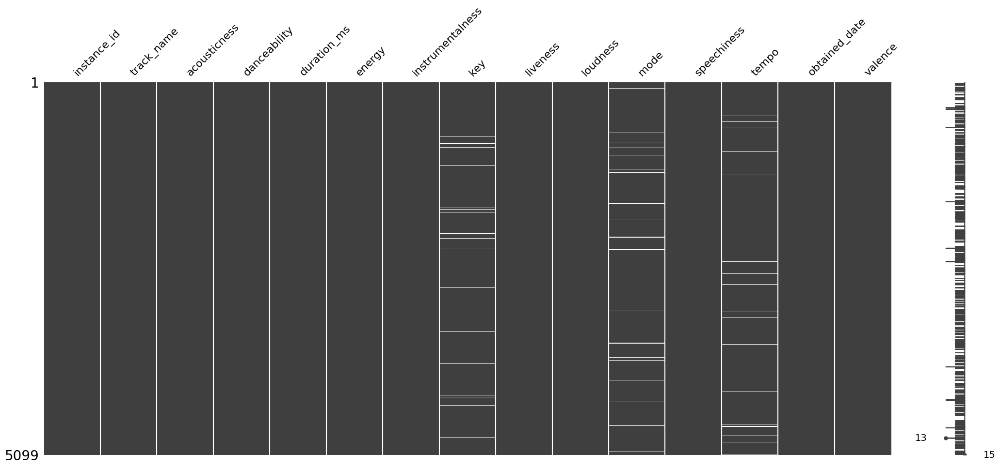

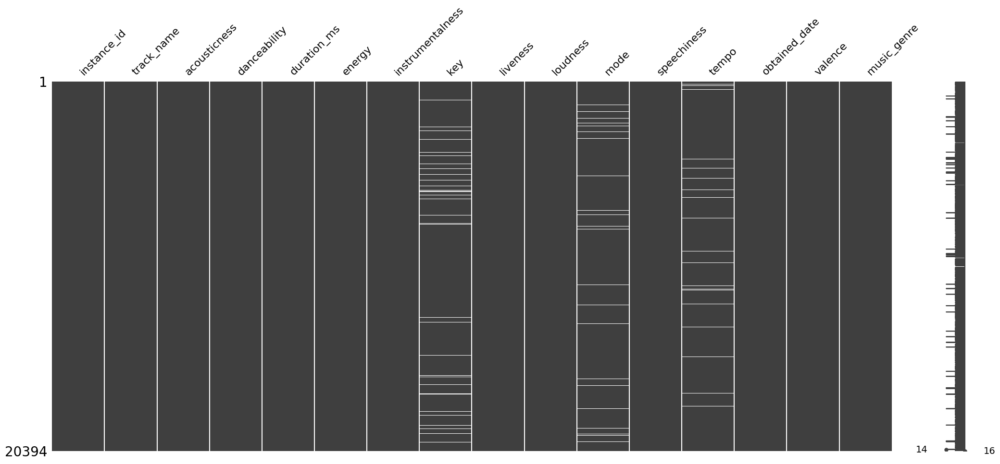

In [6]:
print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
msno.matrix(data_music_test)
print()

print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
msno.matrix(data_music_train)

В обоих датасетах присутствуют пропуски в столбцах: `key`, `mode`  и `tempo`.

По итогу первичной обработки можно заметить наличие пропусков и возможные выбросы данных.

# Подготовка данных

Рассмотрим каждый столбец данных по отдельности.

### Столбец `instance_id`

В данном столбце хранятся уникальные идентификаторы трека. Проверим, что здесь отсутствуют дубликаты.

In [7]:
print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['instance_id'].nunique())
print()

print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
data_music_train['instance_id'].nunique()

data_music_test:
5099

data_music_train:


20394

Отлично, дубликаты отсутствуют. Также можно заметить, что в датасете data_music_train, значения типа float. Изменим тип на int.

In [8]:
data_music_train['instance_id'] = data_music_train['instance_id'].astype(int)
print(data_music_train['instance_id'].dtype)

int64


Проверим наличие дубликатов в строках, исключая столбец с индификатором.

In [9]:
print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(len(data_music_test[data_music_test.drop('instance_id', axis=1).duplicated()]))
print()

print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
len(data_music_train[data_music_train.drop('instance_id', axis=1).duplicated()])

data_music_test:
30

data_music_train:


1

Удалим эти дубликаты.

In [10]:
data_music_test = data_music_test.drop_duplicates(subset=data_music_test.drop('instance_id', axis=1)).reset_index(drop=True)

data_music_train = data_music_train.drop_duplicates(subset=data_music_train.drop('instance_id', axis=1)).reset_index(drop=True)

In [11]:
print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(len(data_music_test[data_music_test.drop('instance_id', axis=1).duplicated()]))
print()

print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
len(data_music_train[data_music_train.drop('instance_id', axis=1).duplicated()])

data_music_test:
0

data_music_train:


0

### Столбец `track_name`

В данном столбце хранятся названия треков. Проверим на наличие дубликатов. 

In [12]:
sum(data_music_train['track_name'].duplicated())

1750

Их не мало, выведем строки с дубликатами и сравним некоторые из них.

In [13]:
pd.concat(g for _, g in data_music_train.groupby("track_name") if len(g) > 1)

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
7581,77103,'75 aka Stay With You,0.030700,0.712,371507.0,0.82700,0.795,C#,0.1220,-7.331,Major,0.0414,126.001,4-Apr,0.305,Jazz
17627,71962,'75 aka Stay With You,0.030700,0.712,371507.0,0.82700,0.795,C#,0.1220,-7.331,Major,0.0414,126.001,4-Apr,0.305,Electronic
11637,60181,(Your Love Keeps Lifting Me) Higher & Higher,0.176000,0.631,181067.0,0.69000,0.000,D,0.1210,-6.676,Major,0.0531,94.574,4-Apr,0.938,Rock
15700,20145,(Your Love Keeps Lifting Me) Higher & Higher,0.176000,0.631,181067.0,0.69000,0.000,D,0.1210,-6.676,Major,0.0531,94.574,4-Apr,0.938,Blues
11894,29350,1 on 1,0.000525,0.905,192840.0,0.67700,0.000,D,0.2510,-7.987,Major,0.3450,140.882,4-Apr,0.598,Hip-Hop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17085,67239,流星,0.990000,0.316,165173.0,0.00447,0.876,C,0.0738,-29.326,Major,0.0384,66.915,5-Apr,0.213,Anime
10092,24851,花水木の咲く頃 - 辻井伸行,0.994000,0.270,209600.0,0.01710,0.921,E,0.1450,-31.429,Major,0.0410,70.931,4-Apr,0.147,Classical
13358,36885,花水木の咲く頃 - 辻井伸行,0.994000,0.270,209600.0,0.01710,0.921,E,0.1450,-31.429,Major,0.0410,70.931,4-Apr,0.147,Anime
1356,90799,道,0.002090,0.478,279200.0,0.59200,0.000,D,0.2450,-5.975,Major,0.0265,139.607,4-Apr,0.271,Anime


Можно заметить, что строки с одинаковыми названиями песен не слишком друг от друга отличаются. Например, песня '75 aka Stay With You встречается дважды, но имеет разницу лишь в жанре. Возникает вопрос, данную песню можно отнести к обоим жанрам, либо же это ошибка внесения данных, а может для разных людей данная песня слышится по своему. Главное, что такие различия вносят неопределенность, а также могут ухудшить модель при обучении.

Здесь также встречаются и различия в других столбцах, когда по большей части треки одинаковые по многим параметрам.

Но также, напримере песни 道	 мы видим, что вероятнее всего эти треки с одинаковым названием, но с разными параметрами. 

Принимаем решение все-таки избавится от этих дубликатов.

In [14]:
data_music_train = data_music_train.drop_duplicates(subset='track_name').reset_index(drop=True)
sum(data_music_train['track_name'].duplicated())

0

Аналогичные действия повторим для второго датасета.

In [15]:
sum(data_music_test['track_name'].duplicated())

88

In [16]:
pd.concat(g for _, g in data_music_test.groupby("track_name") if len(g) > 1)

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence
1178,55488,A Sunday Kind of Love,0.7460,0.396,-1.0,0.2570,0.000000,D,0.3330,-10.943,Minor,0.0304,71.504,5-Apr,0.407
4288,29473,A Sunday Kind of Love,0.7460,0.396,196080.0,0.2570,0.000000,D,0.3330,-10.943,Minor,0.0304,71.504,5-Apr,0.407
2911,20385,After All,0.9210,0.433,322080.0,0.2170,0.714000,A,0.0960,-13.799,Major,0.0343,105.960,3-Apr,0.179
3293,86530,After All,0.1120,0.398,325280.0,0.7740,0.000069,D#,0.1740,-6.834,Major,0.0307,87.967,4-Apr,0.307
2577,36950,Angel Eyes,0.9910,0.334,201800.0,0.0115,0.000212,A,0.0791,-21.169,Minor,0.0410,98.941,3-Apr,0.131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4610,26177,Without You,0.1230,0.626,196800.0,0.9730,0.000003,F#,0.1110,-1.173,Major,0.1850,149.955,4-Apr,0.496
1416,83532,Women,0.4250,0.368,211507.0,0.5920,0.000000,F#,0.0849,-4.317,Major,0.0385,117.988,3-Apr,0.451
4754,57431,Women,0.0483,0.700,207853.0,0.5770,0.030100,C,0.2080,-7.909,Major,0.0263,102.905,4-Apr,0.536
251,55409,You Got Me,0.1700,0.725,259307.0,0.4640,0.000000,B,0.1730,-9.200,Minor,0.2720,80.996,4-Apr,0.689


Ситуация аналогичная, некоторые строки почти полностью дублируют друг друга, а некоторые нет.

Также принимаем решение от них избавится.

In [17]:
data_music_test = data_music_test.drop_duplicates(subset='track_name').reset_index(drop=True)
sum(data_music_test['track_name'].duplicated())

0

Приведем все названия треков к нижнему регистру и проверим на наличие дубликатов.

In [18]:
data_music_train['track_name'] = data_music_train['track_name'].str.lower()

print('Количество дубликатов после приведения к нижнему регистру, data_music_train:')
print(len(data_music_train['track_name'])-data_music_train['track_name'].nunique(), end='\n')

data_music_test['track_name'] = data_music_test['track_name'].str.lower()

print('Количество дубликатов после приведения к нижнему регистру, data_music_test:')
print(len(data_music_test['track_name'])-data_music_test['track_name'].nunique(), end='\n')

Количество дубликатов после приведения к нижнему регистру, data_music_train:
161
Количество дубликатов после приведения к нижнему регистру, data_music_test:
12


In [19]:
pd.concat(g for _, g in data_music_train.groupby("track_name") if len(g) > 1)

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
7535,43016,a kiss to build a dream on,0.9650,0.470,203893.0,0.109,0.000202,C#,0.122,-18.386,Major,0.0377,86.839,4-Apr,0.220,Jazz
7955,25823,a kiss to build a dream on,0.8440,0.735,184493.0,0.122,0.000000,C,0.107,-11.400,Major,0.0636,87.925,4-Apr,0.367,Jazz
12798,84103,a life of illusion,0.0407,0.692,210533.0,0.613,0.065200,D,0.094,-10.735,Major,0.0282,120.901,4-Apr,0.930,Country
15842,90639,a life of illusion,0.0407,0.692,210533.0,0.613,0.065200,D,0.094,-10.735,Major,0.0282,120.901,4-Apr,0.930,Blues
4709,64186,a lot,0.0230,0.775,205539.0,0.600,0.000018,C,0.125,-8.792,Major,0.0857,148.032,4-Apr,0.544,Hip-Hop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9636,56945,you go to my head,0.9420,0.666,576693.0,0.151,0.605000,A#,0.717,-20.383,Minor,0.0568,116.341,4-Apr,0.388,Jazz
3988,35990,you're the one,0.8220,0.594,208227.0,0.462,0.001860,G,0.123,-10.218,Major,0.0403,128.516,4-Apr,0.529,Blues
11090,77134,you're the one,0.0323,0.824,227707.0,0.396,0.002890,D,0.108,-9.663,Major,0.3320,118.053,4-Apr,0.252,Alternative
10282,36154,you've got a friend,0.8800,0.474,308973.0,0.263,0.000044,G#,0.123,-10.684,Major,0.0336,168.683,4-Apr,0.458,Rock


Здесь пока решаем не удалять дубликаты.

### Столбец `acousticness`

В данном столбце хранятся значения меры уверенности от 0,0 до 1,0 в том, что трек является акустическим. 1,0 означает высокую степень уверенности в том, что трек является акустическим. 

При первоначальном осмотре данных (метод describe()) уже видно, что значения лежат в верном диапазоне от 0 до 1.

Построим гистограммы.

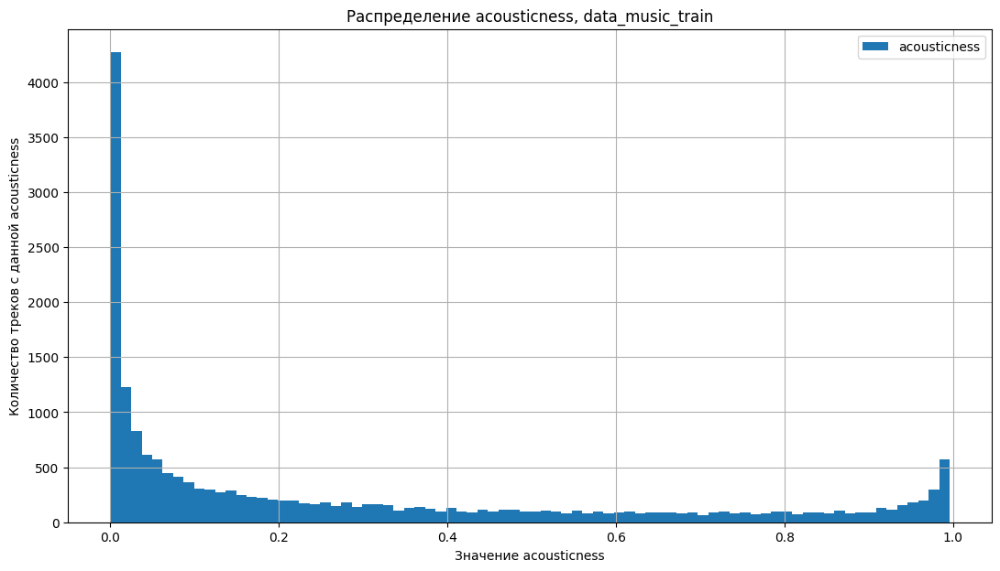

In [20]:
data_music_train.plot(y='acousticness', kind='hist', title='Распределение acousticness, data_music_train',bins=80, figsize=(13,7), grid=True)

plt.xlabel('Значение acousticness')
plt.ylabel('Количество треков с данной acousticness')
plt.show()

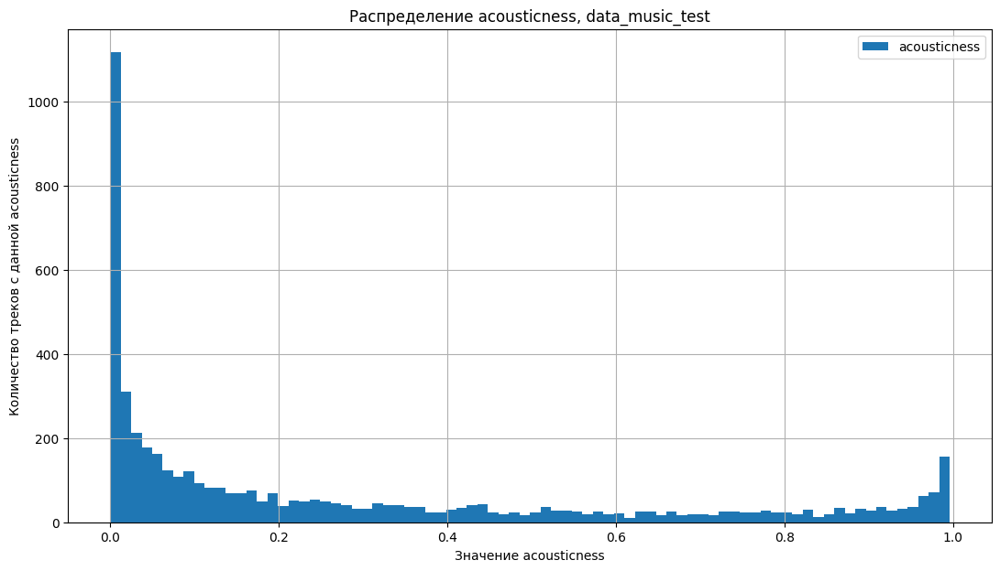

In [21]:
data_music_test.plot(y='acousticness', kind='hist', title='Распределение acousticness, data_music_test',bins=80, figsize=(13,7), grid=True)

plt.xlabel('Значение acousticness')
plt.ylabel('Количество треков с данной acousticness')
plt.show()

Значения меры уверенности сосредоточены около крайних значений: 0 и 1. 

Оставляем данный столбец без изменений.

### Столбец `danceability`
​
В данном столбце хранятся значения меры танцевальности, которая описывает, насколько трек подходит для танцев, основываясь на сочетании музыкальных элементов, включая темп, стабильность ритма, силу ударов и общую регулярность. Значение 0,0 означает наименьшую танцевальность, а 1,0 - наибольшую танцевальность. 
​

При первоначальном осмотре данных (метод describe()) уже видно, что значения лежат в верном диапазоне от 0 до 1.
​

Построим гистограммы.

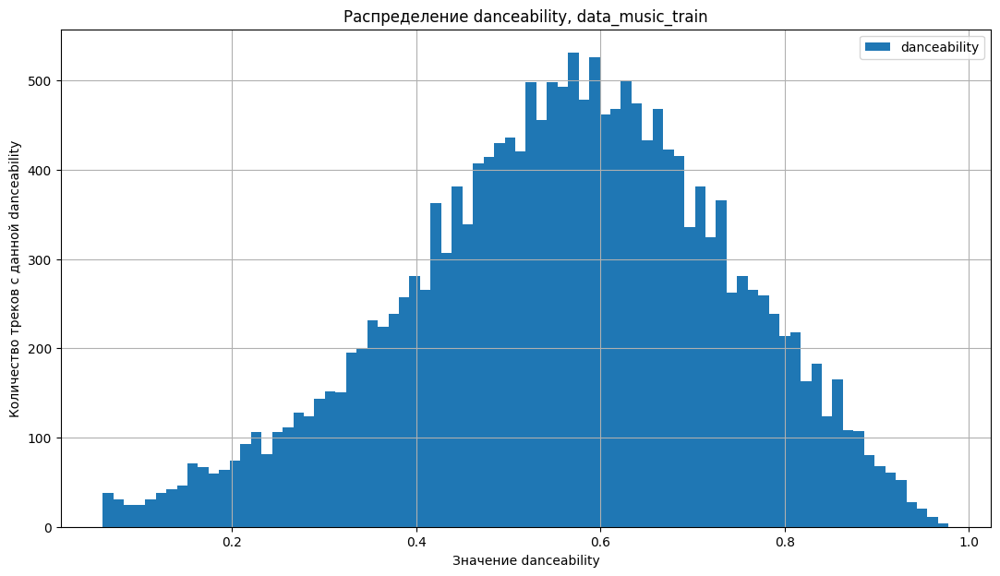

In [22]:
data_music_train.plot(y='danceability', kind='hist', title='Распределение danceability, data_music_train',bins=80, figsize=(13,7), grid=True)

plt.xlabel('Значение danceability')
plt.ylabel('Количество треков с данной danceability')
plt.show()

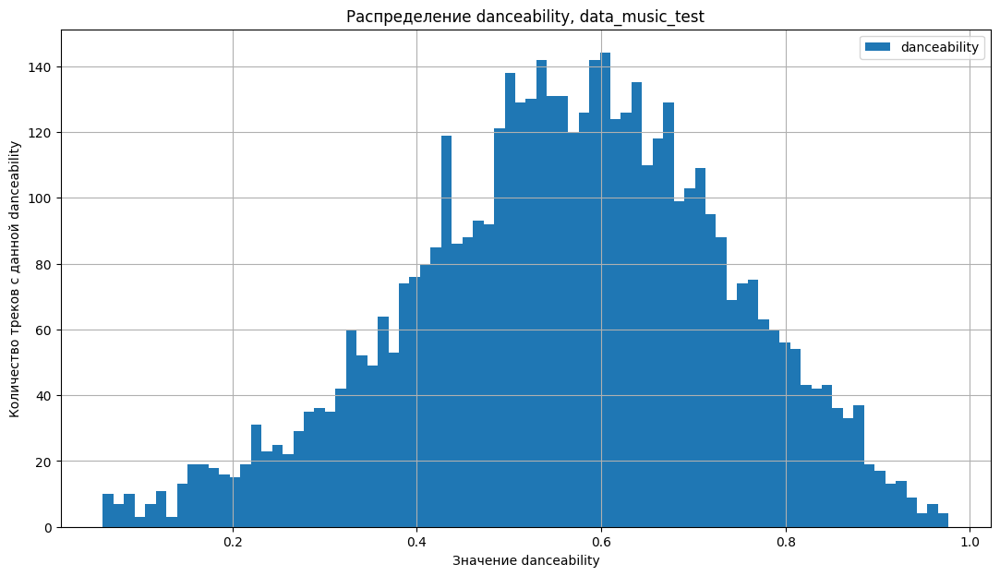

In [23]:
data_music_test.plot(y='danceability', kind='hist', title='Распределение danceability, data_music_test',bins=80, figsize=(13,7), grid=True)

plt.xlabel('Значение danceability')
plt.ylabel('Количество треков с данной danceability')
plt.show()

В обоих датасетах распределение похоже на нормальное.

Построим диаграммы размаха.

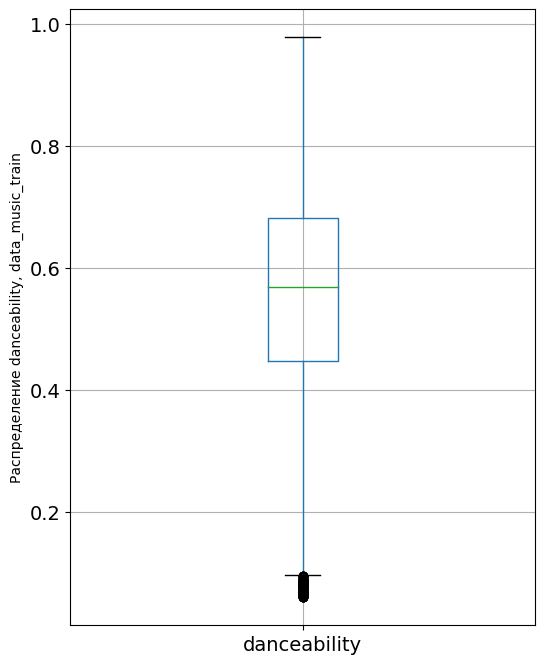

In [24]:
data_music_train.boxplot(column=['danceability'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение danceability, data_music_train')
plt.show()

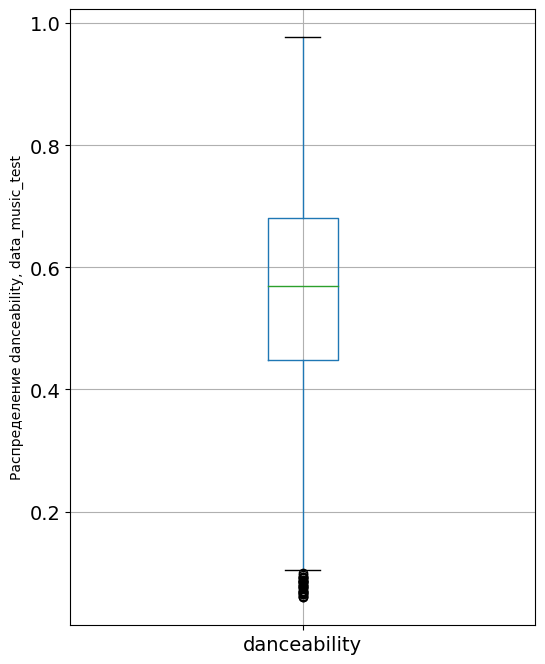

In [25]:
data_music_test.boxplot(column=['danceability'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение danceability, data_music_test')
plt.show()

Мы видим, что есть выбросы. Посчитаем количество этих выбросов.

In [26]:
#Q1, Q3 и IQR для data_music_train
Q1 = data_music_train['danceability'].quantile(q=.25)
IQR = data_music_train['danceability'].apply(stats.iqr)

print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train[data_music_train['danceability'] < (Q1-1.5*IQR)].shape)
print()

#Q1, Q3 и IQR для data_music_test
Q1 = data_music_test['danceability'].quantile(q=.25)
IQR = data_music_test['danceability'].apply(stats.iqr)

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test[data_music_test['danceability'] < (Q1-1.5*IQR)].shape)

data_music_train:
(4632, 16)

data_music_test:
(1237, 15)


Такое большое количество значений говорит о том, что они не являются выбросами, хоть и выходят за границы диаграммы размаха. Избавляться от них нельзя, слишком большая потеря данных.

### Столбец `duration_ms`

В данном столбце хранятся значения продолжительности треков в миллисекундах. 


Построим гистограммы.

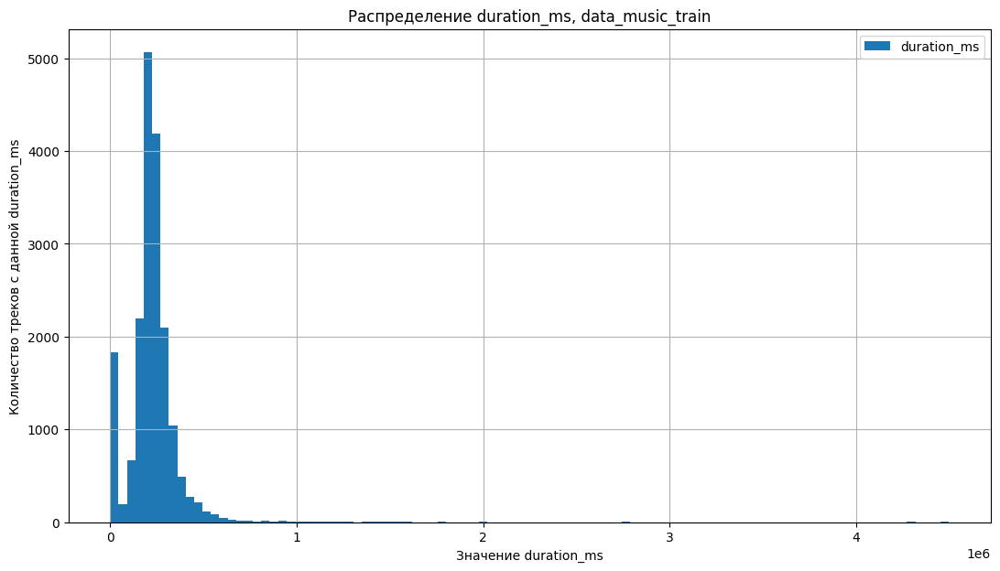

In [27]:
data_music_train.plot(y='duration_ms', kind='hist', title='Распределение duration_ms, data_music_train',bins=100, figsize=(13,7), grid=True)

plt.xlabel('Значение duration_ms')
plt.ylabel('Количество треков с данной duration_ms')
plt.show()

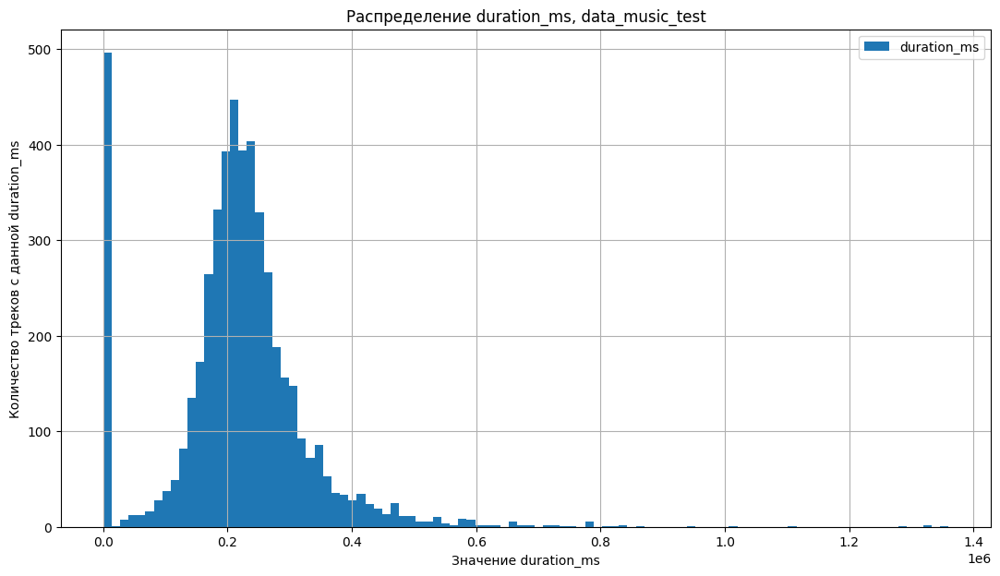

In [28]:
data_music_test.plot(y='duration_ms', kind='hist', title='Распределение duration_ms, data_music_test',bins=100, figsize=(13,7), grid=True)

plt.xlabel('Значение duration_ms')
plt.ylabel('Количество треков с данной duration_ms')
plt.show()

Построим диаграммы размаха.

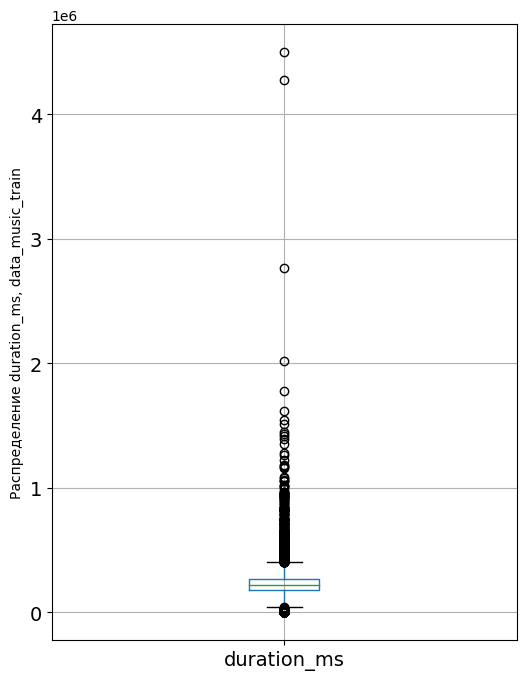

In [29]:
data_music_train.boxplot(column=['duration_ms'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение duration_ms, data_music_train')
plt.show()

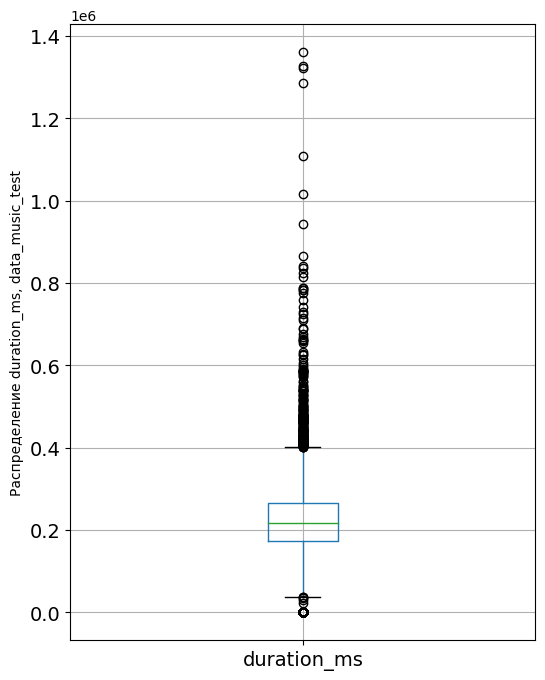

In [30]:
data_music_test.boxplot(column=['duration_ms'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение duration_ms, data_music_test')
plt.show()

В основном треки длятся около 200 сек, то есть около 3 мин. Обозначим границы: очевидно, что треки с продолжительностью менее 30 с и более 15 мин мало вероятны, хотя и могут существовать. 

Поэтому заменим треки с продолжительностью менее 30 с на среднее значение из некоторго среднего диапазона от 30 до 60 с и с продолжительностью более 15 мин на среднее значение из некоторго среднего диапазона от 13 до 15 мин. 

(При удалениии теряется большое количество данных, поэтому делаем замену).

In [31]:
# data_music_train
duration_ms_train_min_mean = data_music_train.query('duration_ms > 30000' and 'duration_ms < 60000')['duration_ms'].mean() #среднее значение от 30 до 60 с
duration_ms_train_max_mean = data_music_train.query('duration_ms > 780000' and 'duration_ms < 900000')['duration_ms'].mean() #среднее значение от 13 до 15 мин

data_music_train.loc[data_music_train['duration_ms'] < 30000, 'duration_ms'] = duration_ms_train_min_mean # замена для значений меньше 30 с
data_music_train.loc[data_music_train['duration_ms'] > 900000, 'duration_ms'] = duration_ms_train_max_mean # замена для значений больше 15 мин

# data_music_train
duration_ms_test_min_mean = data_music_test.query('duration_ms > 30000' and 'duration_ms < 60000')['duration_ms'].mean() #среднее значение от 30 до 60 с
duration_ms_test_max_mean = data_music_test.query('duration_ms > 780000' and 'duration_ms < 900000')['duration_ms'].mean() #среднее значение от 13 до 15 мин

data_music_test.loc[data_music_test['duration_ms'] < 30000, 'duration_ms'] = duration_ms_test_min_mean # замена для значений меньше 30 с
data_music_test.loc[data_music_test['duration_ms'] > 900000, 'duration_ms'] = duration_ms_test_max_mean # замена для значений больше 15 мин

### Столбец `energy`

В данном столбце хранятся значения энергии, которая является показателем от 0,0 до 1,0, представляющий собой меру интенсивности и активности. Как правило, энергичные композиции ощущаются как быстрые, громкие и шумные. Например, дэт-метал обладает высокой энергией, в то время как прелюдия Баха имеет низкую оценку этого параметра. 

При первоначальном осмотре данных (метод describe()) уже видно, что значения лежат в верном диапазоне от 0 до 1.

Построим гистограммы.

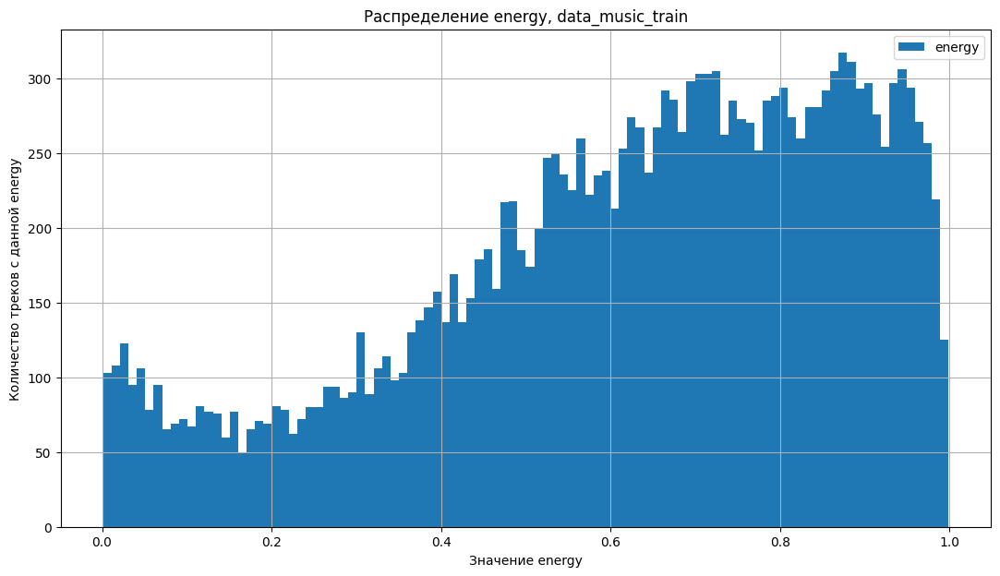

In [32]:
data_music_train.plot(y='energy', kind='hist', title='Распределение energy, data_music_train',bins=100, figsize=(13,7), grid=True)

plt.xlabel('Значение energy')
plt.ylabel('Количество треков с данной energy')
plt.show()

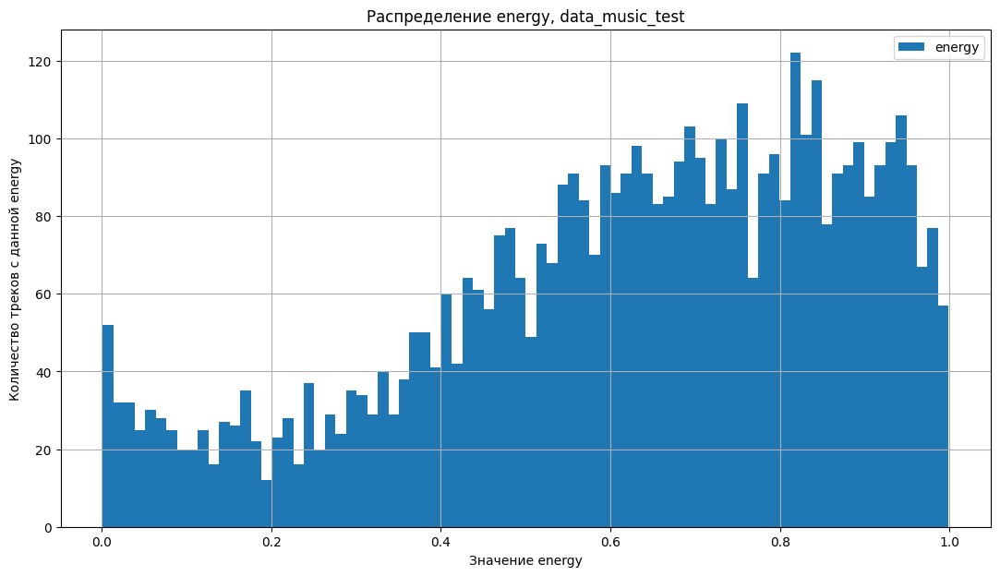

In [33]:
data_music_test.plot(y='energy', kind='hist', title='Распределение energy, data_music_test',bins=80, figsize=(13,7), grid=True)

plt.xlabel('Значение energy')
plt.ylabel('Количество треков с данной energy')
plt.show()

Здесь мы видим, что все таки по большей части в данных больше интенсивных, активных треков, однако так же и присутствуют спокойные.

### Столбец `instrumentalness`

В данном столбце хранятся значения меры, которая определяет, содержит ли трек вокал. Звуки "Ooh" и "aah" в данном контексте рассматриваются как инструментальные. Рэп или разговорные треки явно являются "вокальными". Чем ближе значение инструментальности к 1,0, тем больше вероятность того, что трек не содержит вокала. 

При первоначальном осмотре данных (метод describe()) уже видно, что значения лежат в верном диапазоне от 0 до 1.

Построим гистограммы.

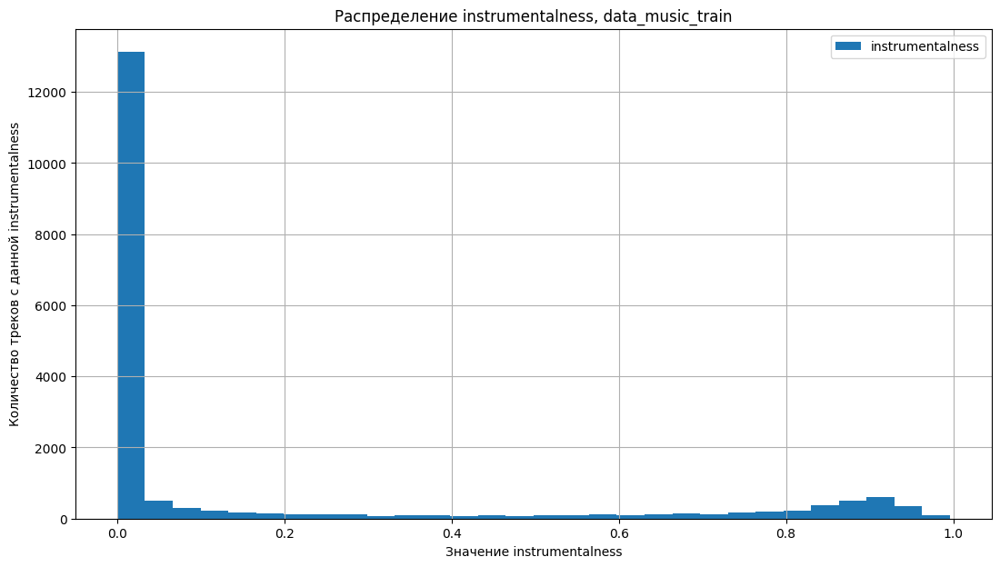

In [34]:
data_music_train.plot(y='instrumentalness', kind='hist', title='Распределение instrumentalness, data_music_train',bins=30, figsize=(13,7), grid=True)

plt.xlabel('Значение instrumentalness')
plt.ylabel('Количество треков с данной instrumentalness')
plt.show()

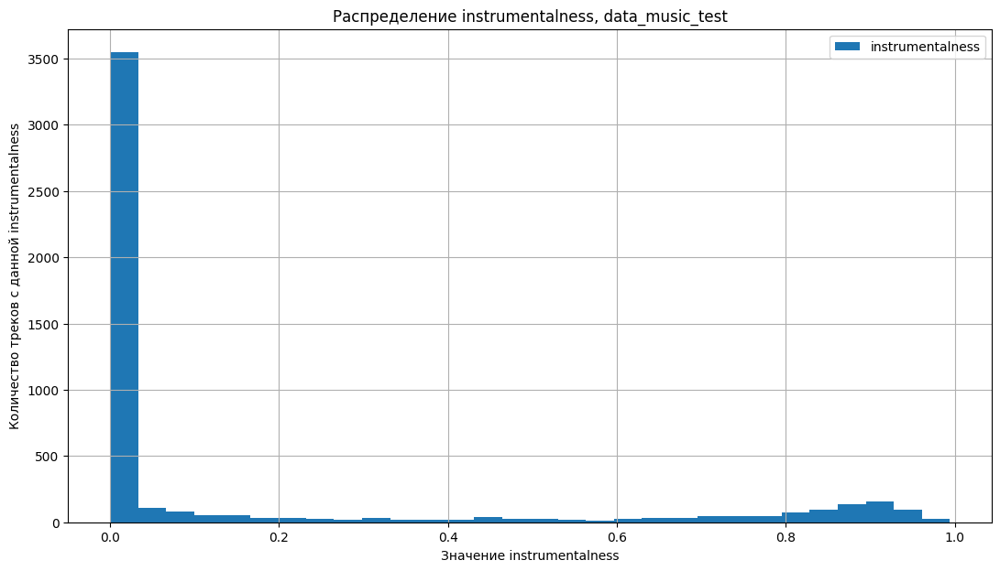

In [35]:
data_music_test.plot(y='instrumentalness', kind='hist', title='Распределение instrumentalness, data_music_test',bins=30, figsize=(13,7), grid=True)

plt.xlabel('Значение instrumentalness')
plt.ylabel('Количество треков с данной instrumentalness')
plt.show()

Логично, в основном большая часть треков - это музыка с вокалом, однако присутствуют и без, например, классическая музыка или джаз без певческого сопровождения и т.д.

### Столбец `key`

В данном столбце хранятся значения базового ключа (нота) произведения. 

Посмотрим уникальные значения.

In [36]:
print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train['key'].unique())
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['key'].unique())

data_music_train:
['D' 'A' 'E' 'G#' 'C' 'D#' 'A#' 'F' 'F#' nan 'G' 'C#' 'B']

data_music_test:
['A#' 'G#' 'A' 'B' 'D' 'F#' 'F' 'G' 'C' nan 'D#' 'C#' 'E']


Имеются пропуски значений, неявные дубликаты отсутствуют. Посчитаем количество пропущенных значений и построим распределение по количеству значений.

In [37]:
print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train['key'].isna().sum())
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['key'].isna().sum())

data_music_train:
670

data_music_test:
155


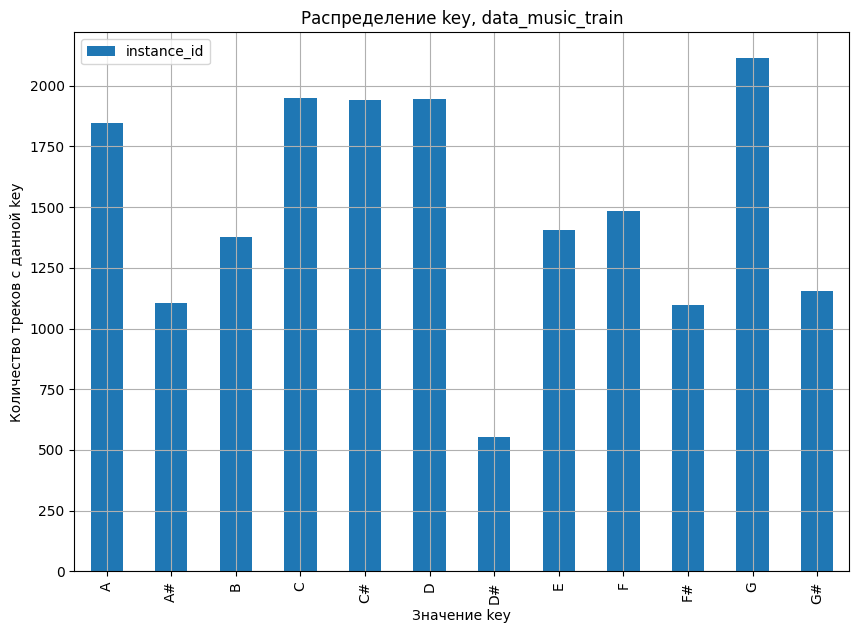

In [38]:
data_music_train.pivot_table(index='key', values='instance_id', aggfunc='count').sort_values(by='key').plot.bar(title='Распределение key, data_music_train', figsize=(10,7), grid=True)

plt.xlabel('Значение key')
plt.ylabel('Количество треков с данной key')
plt.show()

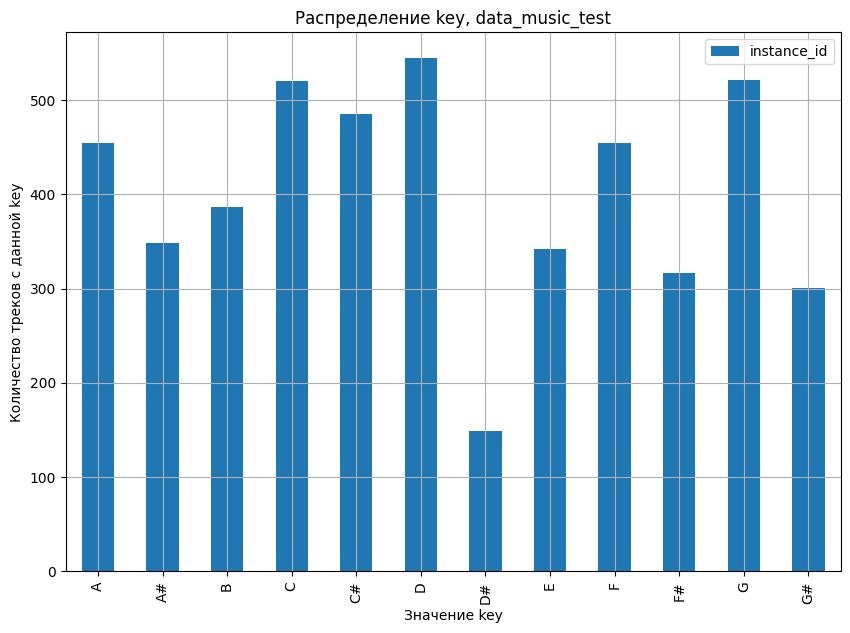

In [39]:
data_music_test.pivot_table(index='key', values='instance_id', aggfunc='count').sort_values(by='key').plot.bar(title='Распределение key, data_music_test', figsize=(10,7), grid=True)

plt.xlabel('Значение key')
plt.ylabel('Количество треков с данной key')
plt.show()

Самыми популярными базовыми ключами произведения являются C, C#, D и G, а самым редковстречаемым - D#. Заменим пропуски значением 'no_key'.

In [40]:
data_music_train['key'] = data_music_train['key'].fillna('no_key')
data_music_test['key'] = data_music_test['key'].fillna('no_key')

print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train['key'].isna().sum())
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['key'].isna().sum())

data_music_train:
0

data_music_test:
0


### Столбец `liveness`

В данном столбце хранятся значения, которые определяют присутствие аудитории в записи. Более высокие значения `liveness` означают увеличение вероятности того, что трек был исполнен вживую. Значение выше 0,8 обеспечивает высокую вероятность того, что трек исполняется вживую.

При первоначальном осмотре данных (метод describe()) уже видно, что значения лежат в верном диапазоне от 0 до 1.

Построим гистограммы.

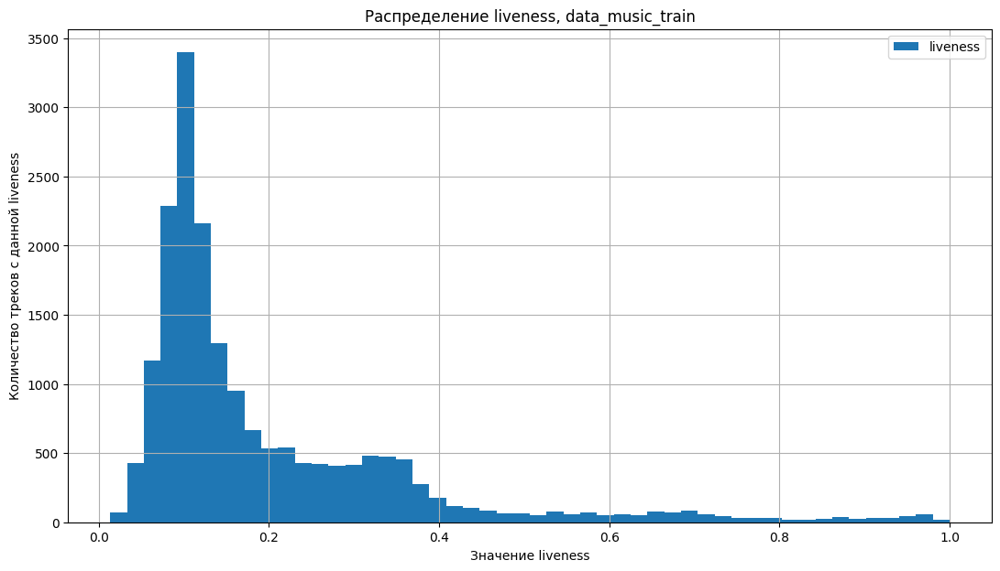

In [41]:
data_music_train.plot(y='liveness', kind='hist', title='Распределение liveness, data_music_train',bins=50, figsize=(13,7), grid=True)

plt.xlabel('Значение liveness')
plt.ylabel('Количество треков с данной liveness')
plt.show()

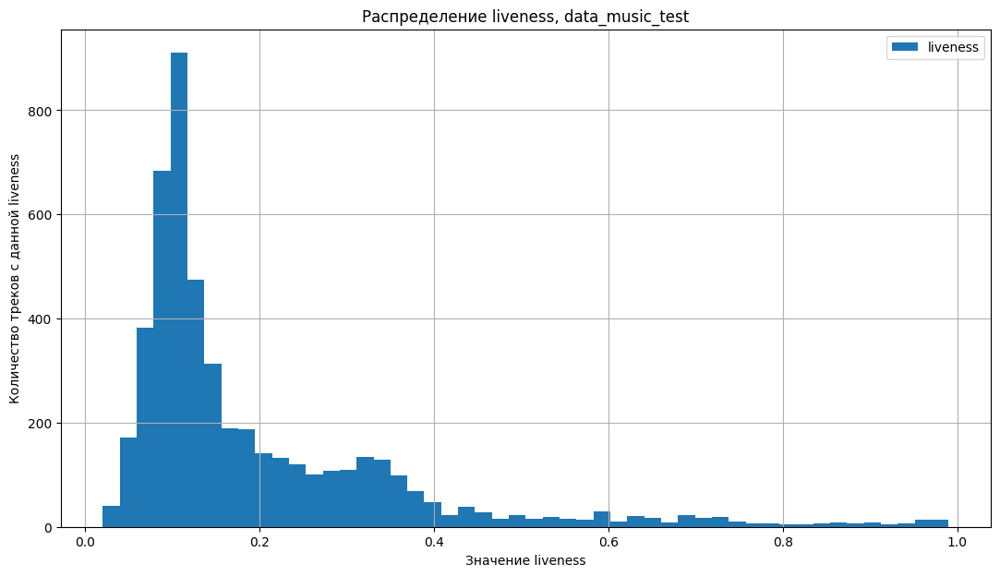

In [42]:
data_music_test.plot(y='liveness', kind='hist', title='Распределение liveness, data_music_test',bins=50, figsize=(13,7), grid=True)

plt.xlabel('Значение liveness')
plt.ylabel('Количество треков с данной liveness')
plt.show()

Мы видим, что данные распределены около значения 0,15. То есть большинство треков записаны и обработаны, что и ожидаемо. Но также и присутствует небольшое количество треков записанных вживую.

### Столбец `loudness`

В данном столбце хранятся значения общей громкости трека в децибелах (дБ).

Построим гистограммы.

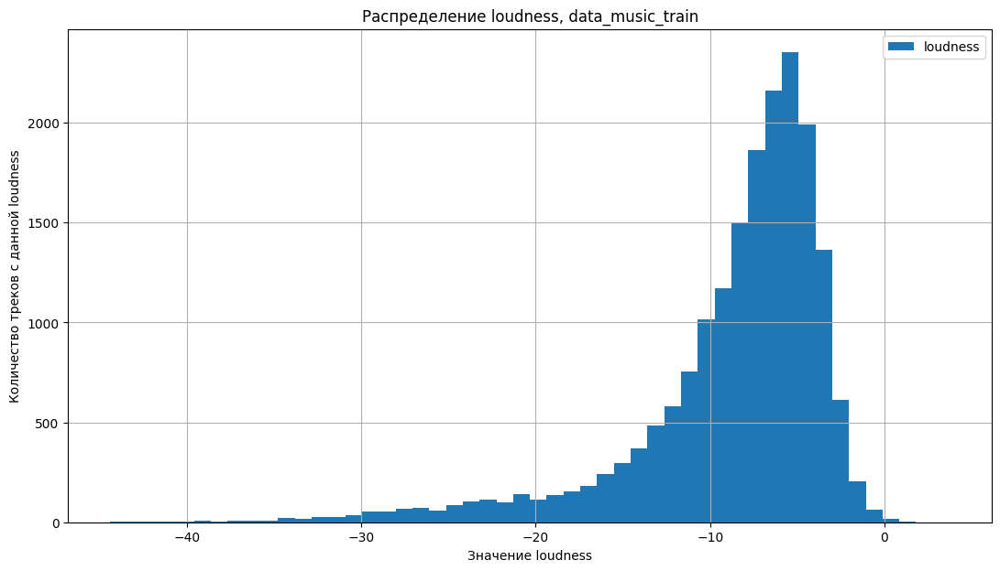

In [43]:
data_music_train.plot(y='loudness', kind='hist', title='Распределение loudness, data_music_train',bins=50, figsize=(13,7), grid=True)

plt.xlabel('Значение loudness')
plt.ylabel('Количество треков с данной loudness')
plt.show()

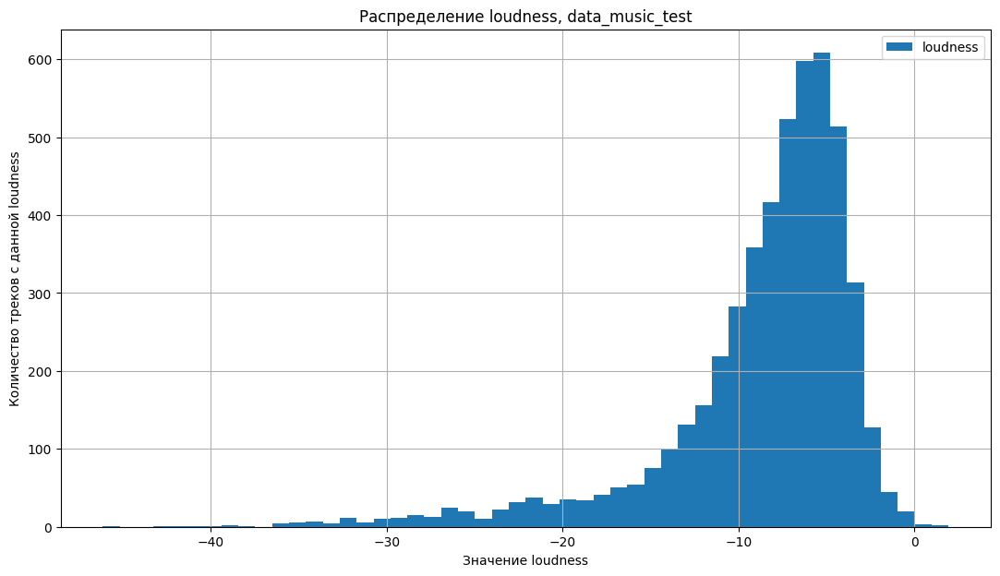

In [44]:
data_music_test.plot(y='loudness', kind='hist', title='Распределение loudness, data_music_test',bins=50, figsize=(13,7), grid=True)

plt.xlabel('Значение loudness')
plt.ylabel('Количество треков с данной loudness')
plt.show()

Значения распределены около -7 дБ.

Мы видим, что значения по большей части отрицательны. Нулевой уровень дБ означает, что в контексте человеческого слуха это некоторое базовое (пороговое) значение. А именно: дБ показывает, во сколько интенсивность звука превышает порог слышимости звука человеком. Например, «громкость звука составляет 30 дБ» означает, что интенсивность звука в 1000 раз превышает порог слышимости звука человеком. дБ имеет логарифмическую зависимость, которая показывает не насколько громкий звук, а на сколько порядков этот звук мощнее базового уровня.

В нашем случае - отрицательные значения показывают, во сколько интенсивность звука мягче порога слышимости. При работе с профессиональным звуковым оборудованием 0 дБ обычно относится к самому громкому уровню перед началом искажения. Но при этом, по итогу работы музыка может быть и выше данного порога (все зависит от самого трека).

Построим диаграммы размаха.

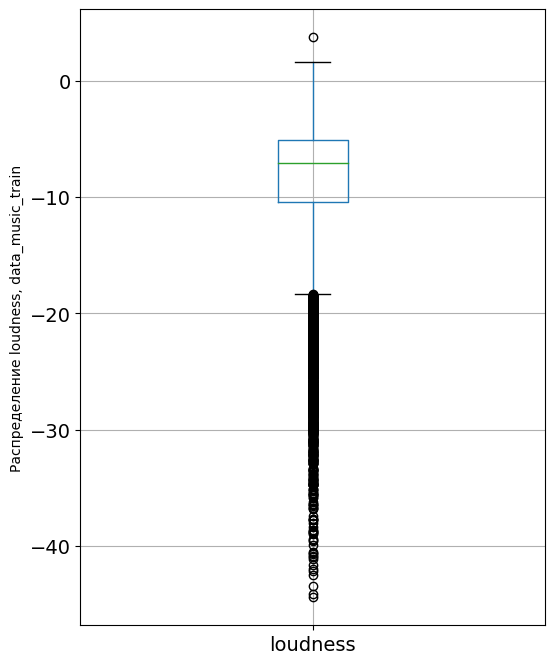

In [45]:
data_music_train.boxplot(column=['loudness'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение loudness, data_music_train')
plt.show()

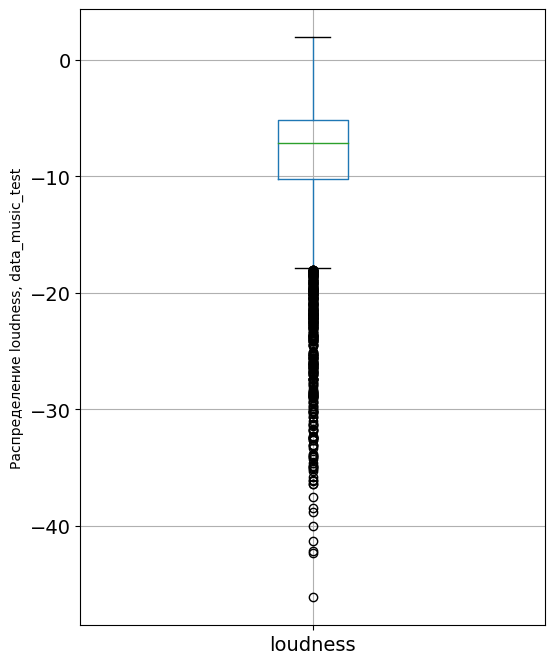

In [46]:
data_music_test.boxplot(column=['loudness'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение loudness, data_music_test')
plt.show()

Мы видим распределение с явным хвостом в сторону уменьшения значений. При этом, все значения (как мне кажется) можно оставить, так как все они возможны.

### Столбец `mode`

В данном столбце хранятся значения, указывающие на модальность (мажорную или минорную) трека.

Выведем уникальные значения.

In [47]:
print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train['mode'].unique())
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['mode'].unique())

data_music_train:
['Major' 'Minor' nan]

data_music_test:
['Minor' 'Major' nan]


Имеются пропуски значений, неявные дубликаты отсутствуют. Посчитаем количество пропущенных значений.

In [48]:
print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train['mode'].isna().sum())
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['mode'].isna().sum())

data_music_train:
467

data_music_test:
145


 Заменим пропуски значением 'no_mode'.

In [49]:
data_music_train['mode'] = data_music_train['mode'].fillna('no_mode')
data_music_test['mode'] = data_music_test['mode'].fillna('no_mode')

print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train['mode'].isna().sum())
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['mode'].isna().sum())

data_music_train:
0

data_music_test:
0


Построим кругвые диагарммы, что посмотреть распределение значений.

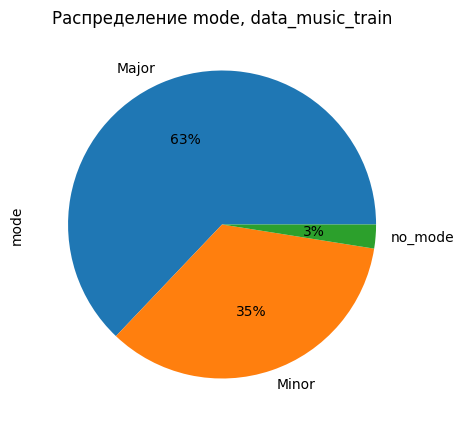

In [50]:
data_music_train['mode'].value_counts().plot(kind='pie', y=data_music_train['mode'].value_counts(), autopct='%1.0f%%', figsize=(5,5), title='Распределение mode, data_music_train')

plt.ylabel('mode')
plt.show()

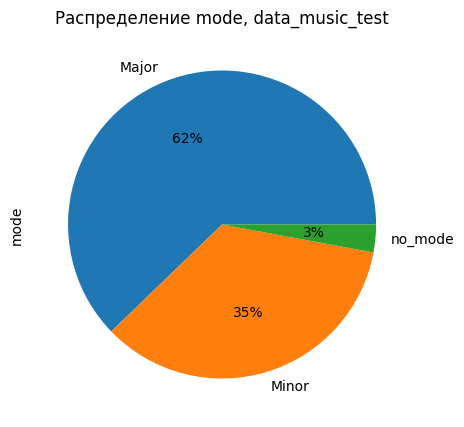

In [51]:
data_music_test['mode'].value_counts().plot(kind='pie', y=data_music_test['mode'].value_counts(), autopct='%1.0f%%', figsize=(5,5), title='Распределение mode, data_music_test')

plt.ylabel('mode')
plt.show()

Около 2/3 треков имеют мажорную модельность, около 1/3 - минорную. Около 3 % не имеют значений.

### Столбец `speechiness`

В данном столбце хранятся значения речевого характера, который определяет наличие в треке разговорной речи. Чем более исключительно речевой характер носит запись (например, ток-шоу, аудиокнига, поэзия), тем ближе значение атрибута к 1,0. Значения выше 0,66 характеризуют треки, которые, вероятно, полностью состоят из разговорной речи. Значения от 0,33 до 0,66 характеризуют треки, которые могут содержать как музыку, так и речь, как в виде фрагментов, так и в виде слоев, включая такие случаи, как рэп-музыка. Значения ниже 0,33, скорее всего, представляют музыку и другие неречевые треки.

При первоначальном осмотре данных (метод describe()) уже видно, что значения лежат в верном диапазоне от 0 до 1.

Построим гистограммы.

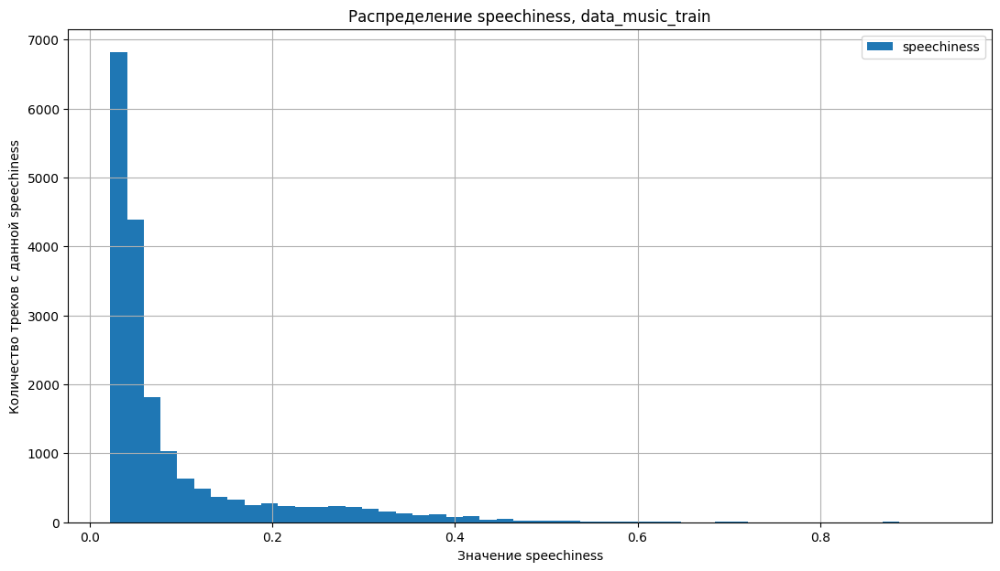

In [52]:
data_music_train.plot(y='speechiness', kind='hist', title='Распределение speechiness, data_music_train',bins=50, figsize=(13,7), grid=True)

plt.xlabel('Значение speechiness')
plt.ylabel('Количество треков с данной speechiness')
plt.show()

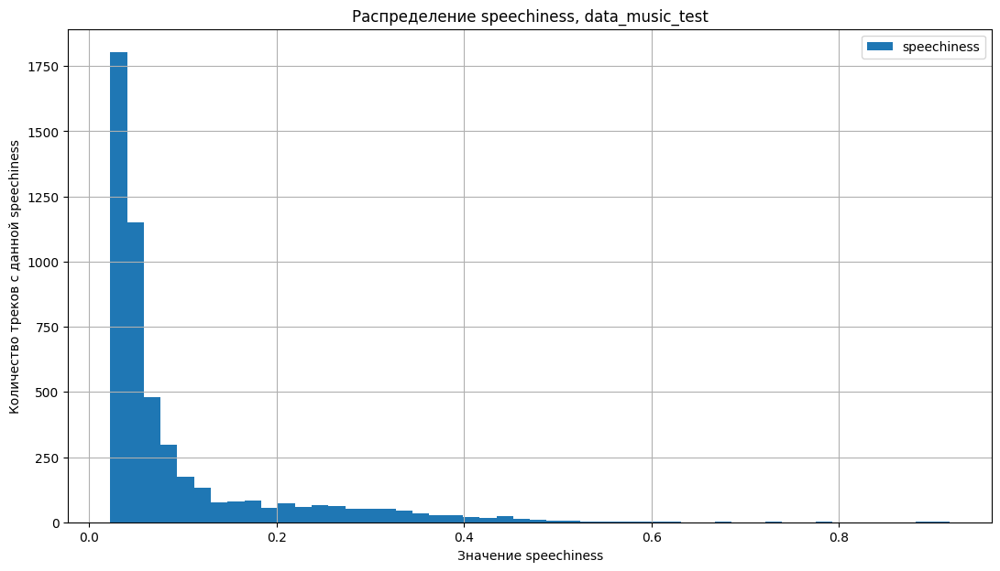

In [53]:
data_music_test.plot(y='speechiness', kind='hist', title='Распределение speechiness, data_music_test',bins=50, figsize=(13,7), grid=True)

plt.xlabel('Значение speechiness')
plt.ylabel('Количество треков с данной speechiness')
plt.show()

Также построим диагарммы размаха.

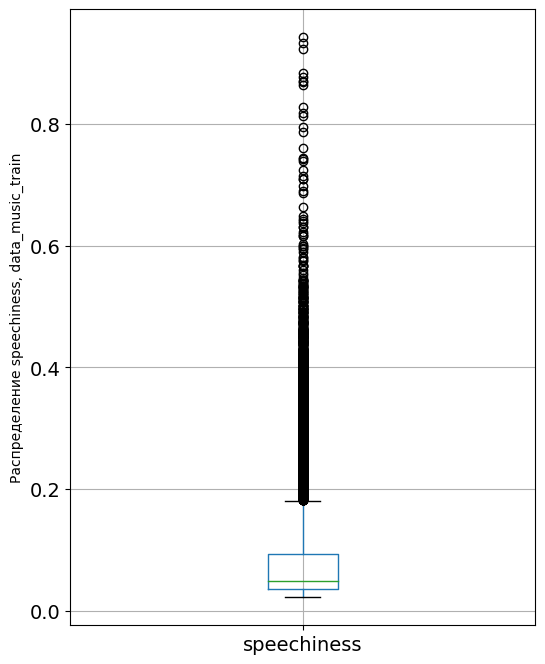

In [54]:
data_music_train.boxplot(column=['speechiness'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение speechiness, data_music_train')
plt.show()

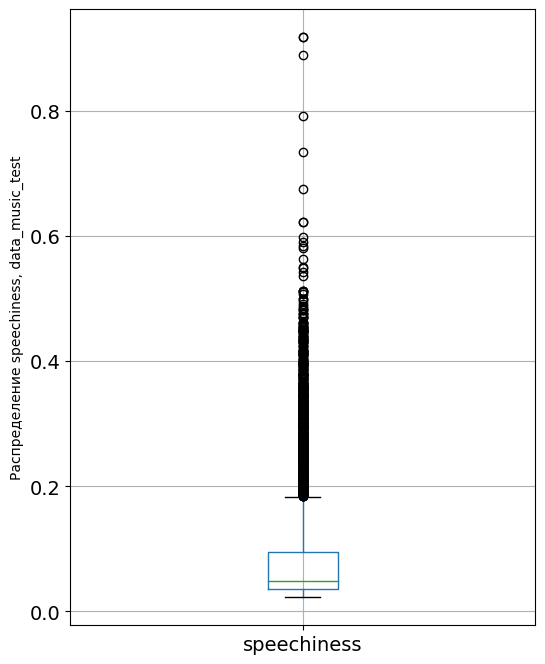

In [55]:
data_music_test.boxplot(column=['speechiness'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение speechiness, data_music_test')
plt.show()

Значения распределены около 0,05 и дальше имеют длинный хвост в строну увеличения значений.

In [56]:
print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(len(data_music_train.loc[data_music_train['speechiness'] > 0.6, 'speechiness']))
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(len(data_music_test.loc[data_music_test['speechiness'] > 0.6, 'speechiness']))

data_music_train:
36

data_music_test:
8


Можно принять, что значения больше 0,6 являются выбросами и избавиться от них.

In [57]:
data_music_train['speechiness'] = data_music_train.loc[data_music_train['speechiness'] <= 0.6, 'speechiness']
data_music_test['speechiness'] = data_music_test.loc[data_music_test['speechiness'] <= 0.6, 'speechiness']

### Столбец `tempo`

В данном столбце хранятся значения темпа трека в ударах в минуту (BPM). В музыкальной терминологии темп представляет собой скорость или темп данного произведения и напрямую зависит от средней продолжительности тактов.

Построим гистограммы.

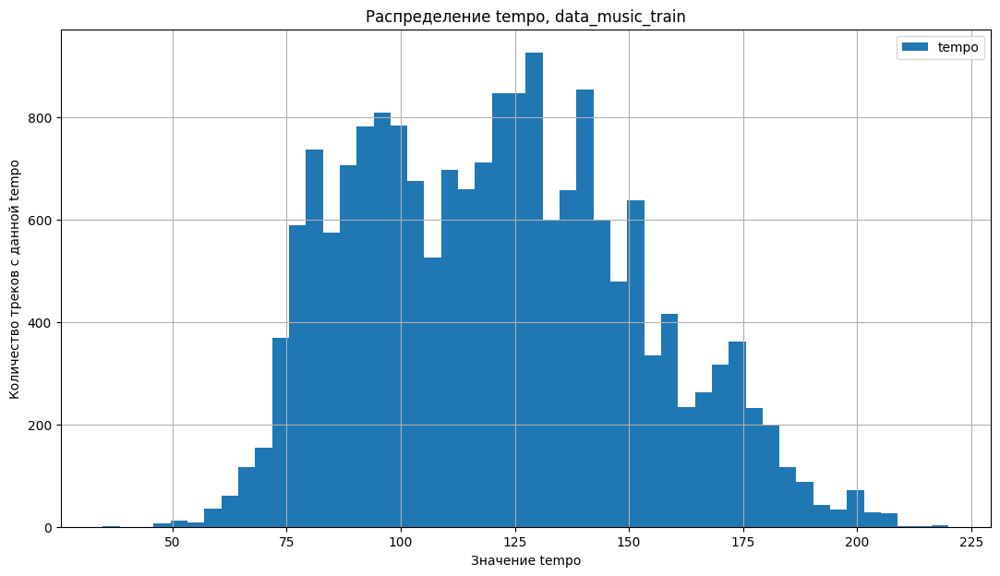

In [58]:
data_music_train.plot(y='tempo', kind='hist', title='Распределение tempo, data_music_train',bins=50, figsize=(13,7), grid=True)

plt.xlabel('Значение tempo')
plt.ylabel('Количество треков с данной tempo')
plt.show()

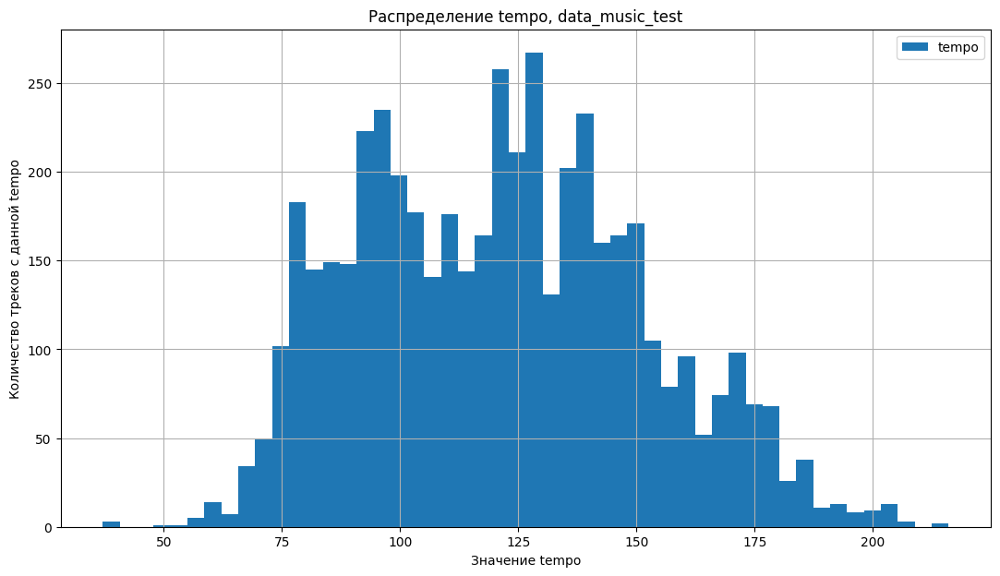

In [59]:
data_music_test.plot(y='tempo', kind='hist', title='Распределение tempo, data_music_test',bins=50, figsize=(13,7), grid=True)

plt.xlabel('Значение tempo')
plt.ylabel('Количество треков с данной tempo')
plt.show()

В основном значения находятся в диапазоне от 75 до 150 BPM. Построим диагараммы размаха.

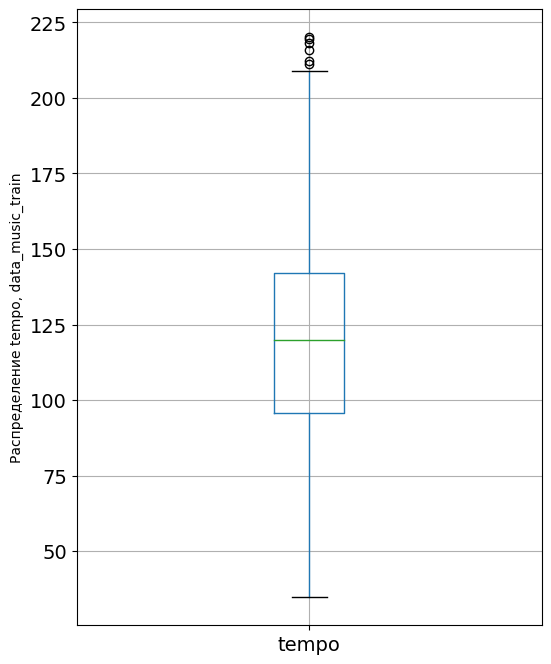

In [60]:
data_music_train.boxplot(column=['tempo'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение tempo, data_music_train')
plt.show()

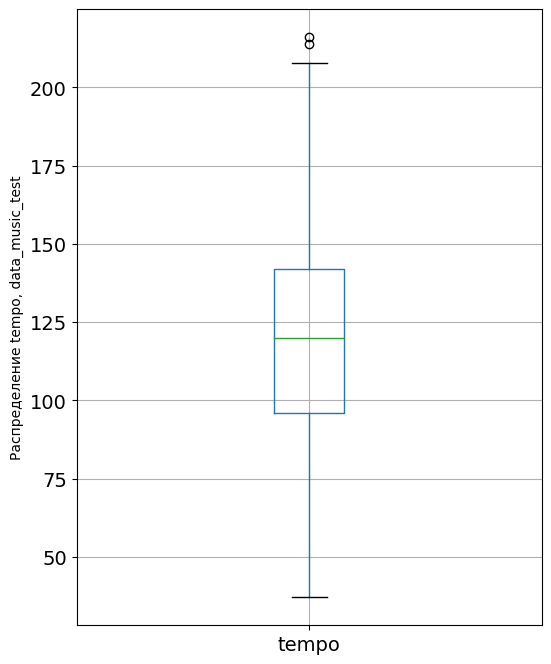

In [61]:
data_music_test.boxplot(column=['tempo'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение tempo, data_music_test')
plt.show()

In [62]:
#Q1, Q3 и IQR для data_music_train
Q1 = data_music_train['tempo'].quantile(q=.25)
Q3 = data_music_train['tempo'].quantile(q=.75)
IQR = Q3-Q1

print('data_music_train:', Q3+1.5*IQR)

#Q1, Q3 и IQR для data_music_test
Q1 = data_music_test['tempo'].quantile(q=.25)
Q3 = data_music_test['tempo'].quantile(q=.75)
IQR = Q3-Q1

print('data_music_test', Q3+1.5*IQR)

data_music_train: 211.18825000000004
data_music_test 210.851


Примем за верхнюю границу значение равное 210. Значения выше данной границы удалим.

In [63]:
data_music_train['tempo'] = data_music_train.loc[data_music_train['tempo'] <= 210, 'tempo']
data_music_test['tempo'] = data_music_test.loc[data_music_test['tempo'] <= 210, 'tempo']

Также, при первом осмотре данных мы обнаружили в данном столбце пропуски.

In [64]:
print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train['tempo'].isna().sum())
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['tempo'].isna().sum())

data_music_train:
411

data_music_test:
122


Принимаем решение заполнить пропуски средним значением.

In [65]:
data_music_train['tempo'] = data_music_train['tempo'].fillna(data_music_train['tempo'].mean())
data_music_test['tempo'] = data_music_test['tempo'].fillna(data_music_test['tempo'].mean())

print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train['tempo'].isna().sum())
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['tempo'].isna().sum())

data_music_train:
0

data_music_test:
0


### Столбец `obtained_date`

В данном столбце хранятся даты загрузки треков в сервис.

Посмотрим даты загрузок.

In [66]:
print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print(data_music_train['obtained_date'].unique())
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print(data_music_test['obtained_date'].unique())

data_music_train:
['4-Apr' '3-Apr' '5-Apr' '1-Apr']

data_music_test:
['4-Apr' '3-Apr' '5-Apr' '1-Apr']


Всего 4 дня загрузки. Конечно же можно перевести данный столбец в временной формат, однако, как мне кажется, данный столбец не несет никакой информации о жанре трека, поэтому не будем тратить на него время, так как далее мы его удалим.

### Столбец `valence`

В данном столбце хранятся значения показателя от 0,0 до 1,0, характеризующего музыкальный позитив, передаваемый треком. Композиции с высокой валентностью звучат более позитивно (например, радостно, весело, эйфорично), а композиции с низкой валентностью - более негативно (например, грустно, депрессивно, сердито).

При первоначальном осмотре данных (метод describe()) уже видно, что значения лежат в верном диапазоне от 0 до 1.

Построим гистограммы.

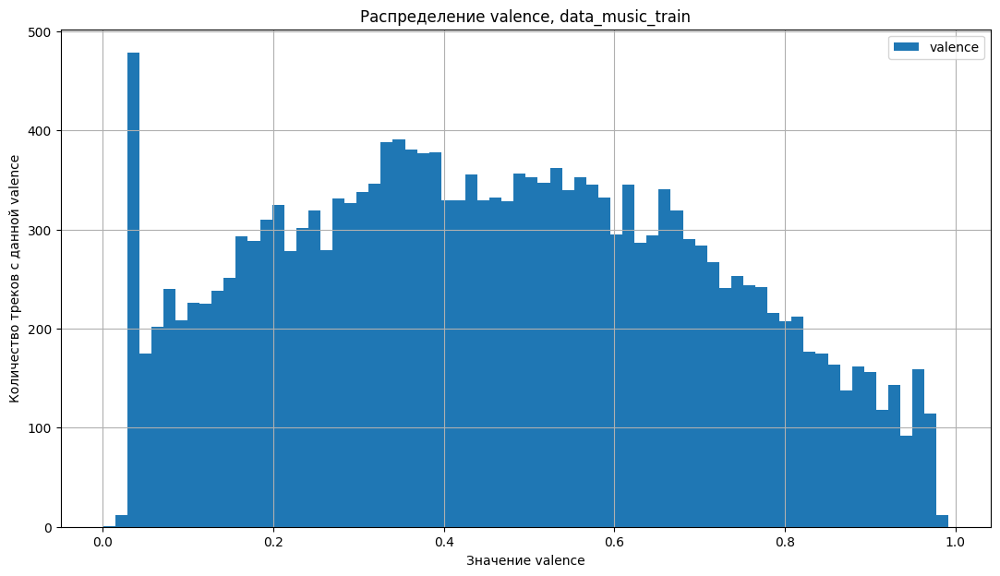

In [67]:
data_music_train.plot(y='valence', kind='hist', title='Распределение valence, data_music_train',bins=70, figsize=(13,7), grid=True)

plt.xlabel('Значение valence')
plt.ylabel('Количество треков с данной valence')
plt.show()

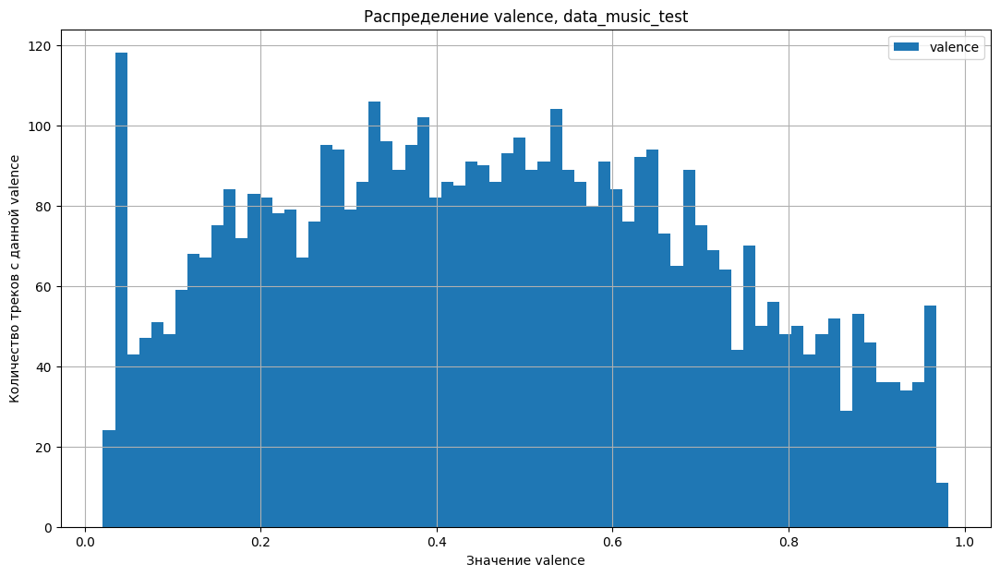

In [68]:
data_music_test.plot(y='valence', kind='hist', title='Распределение valence, data_music_test',bins=70, figsize=(13,7), grid=True)

plt.xlabel('Значение valence')
plt.ylabel('Количество треков с данной valence')
plt.show()

Построим диаграммы размаха.

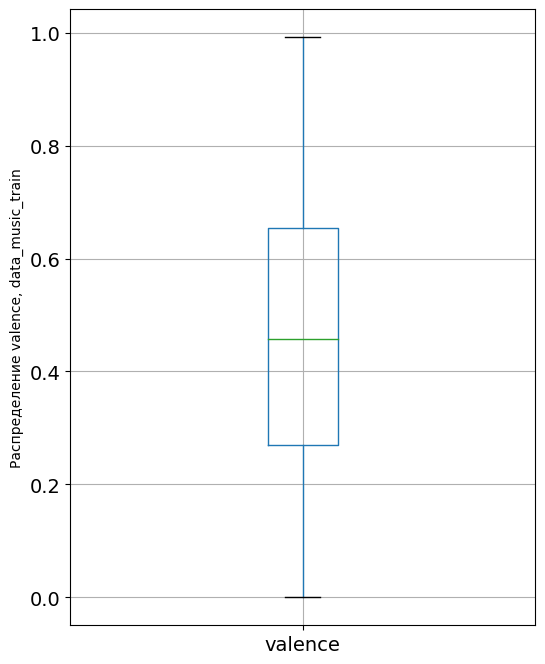

In [69]:
data_music_train.boxplot(column=['valence'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение valence, data_music_train')
plt.show()

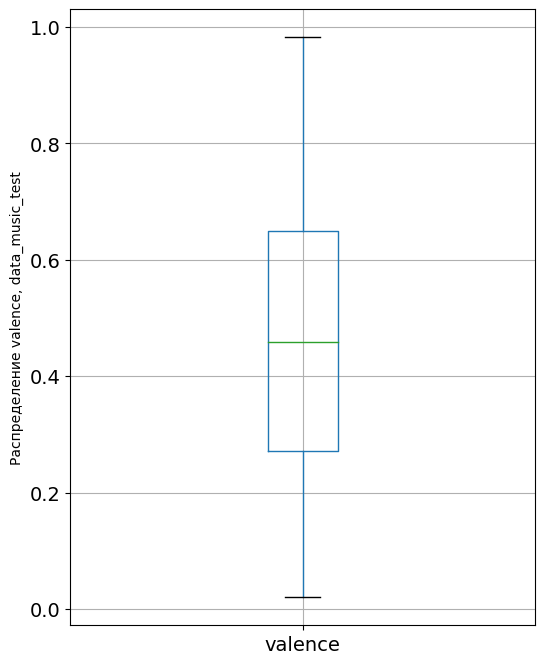

In [70]:
data_music_test.boxplot(column=['valence'], figsize=(6,8), grid=True, fontsize=14)
plt.ylabel('Распределение valence, data_music_test')
plt.show()

На диаграмах мы видим более-менее равномерное распределение (похоже на нормальное) значений, но с пиком около 0.03. Однако в диагармме размахов отсутствуют выбросы, поэтому оставляем данный столбец без изменений.

### Столбец `music_genre`

В данном столбце хранятся наименование музыкального жанра трека.

Посморим уникальные значения, проверим наличие неявных дубликатов.

In [71]:
data_music_train['music_genre'].unique()

array(['Country', 'Rock', 'Alternative', 'Hip-Hop', 'Blues', 'Jazz',
       'Electronic', 'Anime', 'Rap', 'Classical'], dtype=object)

Здесь все в порядке.

Построим круговую диагармму.

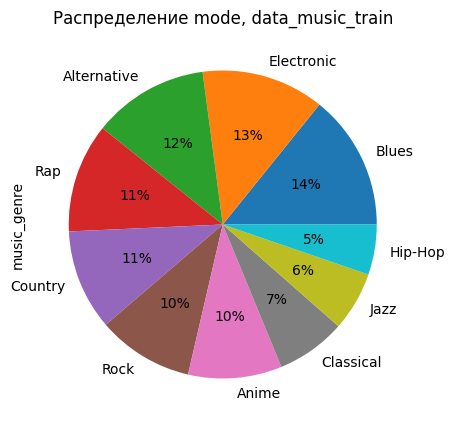

In [72]:
data_music_train['music_genre'].value_counts().plot(kind='pie', y=data_music_train['music_genre'].value_counts(), autopct='%1.0f%%', figsize=(5,5), title='Распределение mode, data_music_train')

plt.ylabel('music_genre')
plt.show()

Теперь посмотрим, сколько данных мы потеряли после обработки.

In [73]:
print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
print((data_music_train_old.shape[0]-data_music_train.shape[0])/data_music_train_old.shape[0] * 100)
print()

print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
print((data_music_test_old.shape[0]-data_music_test.shape[0])/data_music_test_old.shape[0] * 100)


data_music_train:
8.585858585858585

data_music_test:
2.314179250833497


Таким образом, при обработке данных для файла с обучающими данными мы потеряли около 8,6 %, а для файла с тестовыми данными - 2,3 %. Не мало, но и не критично.

**Вывод** по загрузке и подготовке данных.

Было загружено два файла: файл с обучающими данными - `data_music_train`, файл с тестовыми данными - `data_music_test`.

Первичный осмотр показал наличие пропусков в столбцах: `key`, `mode`  и `tempo`.

Далее следовал детальный осмотр данных, при котором были обнаружены следующие детали:
- найдены дубликаты строки, исключая столбец индификатор. Они были удалены;
- были изменены типы столбцов при необходимости;
- при поиске дубликатов по названию трека были обнаружены практически идентичные строки, в которых отличались лишь некоторые параметры. Было принято решение их удалить, так как строки были практически дубликатами, что вероятнее всего произошло из-за неверного введения данных, либо по той причине, что у каждого человека разное восприятие музыки и т.д. Также после название треков были приведены к нижнему регистру и снова сравнены. дубликаты по названию снова обнаружились, однако в данном случае расхождение по остальным параметрам было больше. Вероятнее всего данные треки просто имели одинаковое название (так как они обнаружились после приведения к нижнему регистру, то можно сказать, что и названия у них были разные, и это не является неявным дубликатом). Данные треки оставили.
- значения меры уверенности сосредоточены около крайних значений: 0 и 1;
- значения танцевальности распределены примерно нормально, но с небольшим хвостом;
- в основном треки длятся около 200 сек, то есть около 3 мин. Решили взять границы: треки с продолжительностью менее 30 с и более 15 мин мало вероятны, хотя и могут существовать. Поэтому заменили треки с продолжительностью менее 30 с на среднее значение из некоторго среднего диапазона от 30 до 60 с и с продолжительностью более 15 мин на среднее значение из некоторго среднего диапазона от 13 до 15 мин;
- в данных больше интенсивных, активных треков, однако так же и присутствуют спокойные;
- большая часть треков - это музыка с вокалом, однако присутствуют и без, например, классическая музыка или джаз без певческого сопровождения и т.д.;
- самыми популярными базовыми ключами произведения являются C, C#, D и G, а самым редковстречаемым - D#. Заменили пропуски значением 'no_key';
- значения, которые определяют присутствие аудитории в записи, распределены около 0,15. То есть большинство треков записаны и обработаны, что и ожидаемо. Но также и присутствует небольшое количество треков записанных вживую;
- значения громкости звука распределены около 7 дБ с хвостом в сторону уменьшения значений.
- около 2/3 треков имеют мажорную модальность, около 1/3 - минорную. Около 3 % значений имели пропуски, которые были заменены на 'no_mode';
- значения речевого характера, который определяет наличие в треке разговорной речи распределены около 0,05 и дальше имеют длинный хвост в строну увеличения значений. Приняли, что значения больше 0,6 являются выбросами и избавились от них;
- для значений темпа трека в ударах в минуту (BPM) приняли за верхнюю границу значение равное 210. Значения выше данной границы удалили. Пропуски заполнили средним значением.
- Были найдены всего 4 дня загрузки: 1,3,4 и 5 апреля. Данный столбец не несет никакой информации о жанре трека, поэтому далее он будет удален.
- значения показателя, характеризующего музыкальный позитив, передаваемый треком, распределены более-менее равномерно (похоже на нормальное), но с пиком около 0.03.
- в жанрах музыки не обнаружены неявные дубликаты.

При обработке данных для файла с обучающими данными мы потеряли около 8,6 %, а для файла с тестовыми данными - 2,3 %.

# Разработка новых синтетических признаков

Идеи:
- для некоторых стоблцов заменить значения на категориальные признаки: например танцевальность - танцевальный, средне-танцевальный и не танцевальный. Но необходимо для каждого жанра проанализировать, какое из значений ему присуще. И вообще, подходит ли данная замена для всех жанров.
- попробывать поиграться с названиями треков. Может выделить какие-то слова маркеры, которые встречаются в названиях у определенных жанров.

# Проверка на мультиколлинеарность

Изучим корреляции в данных. Так мы сможем оценить взаимосвязи в данных и влияние параметров на целевой признак. Из признаков убираем те, что не несут влияния на целевой признак (например, уникальный идентификатор трека, название или дата загрузки).

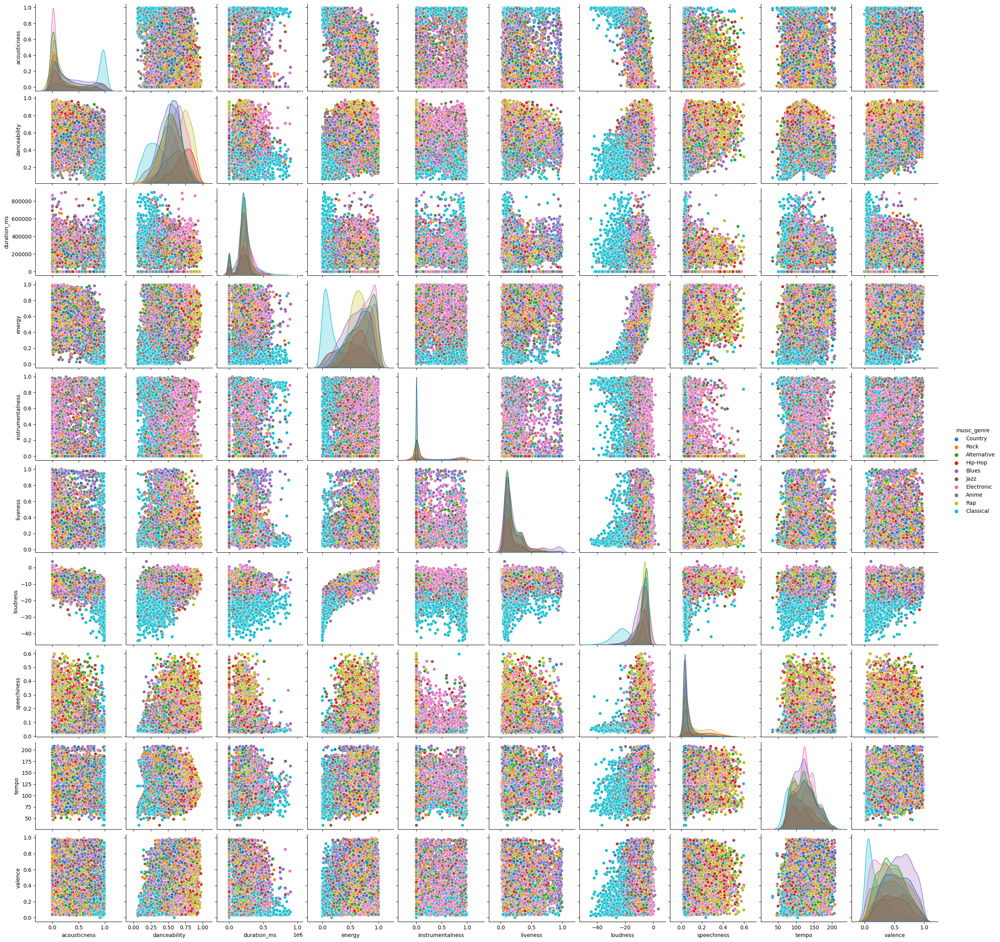

In [74]:
sns.pairplot(data_music_train.drop(['instance_id', 'track_name', 'obtained_date'], axis=1), hue="music_genre")
plt.show()

Также построим матрицу корреляции.

<Axes: >

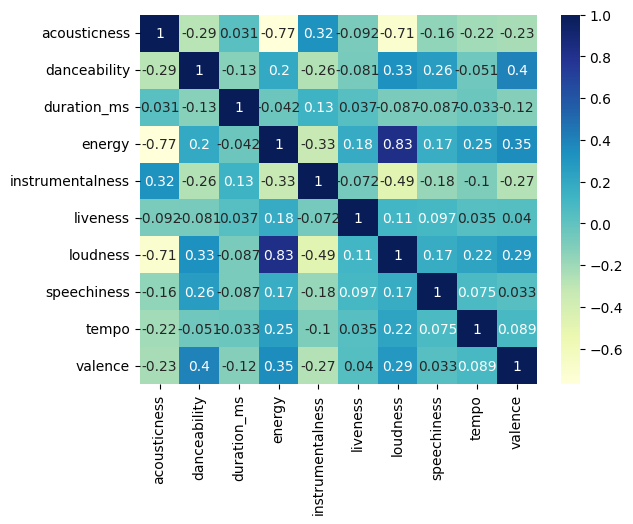

In [75]:
sns.heatmap(data_music_train.drop(['instance_id', 'track_name', 'obtained_date','key','mode','music_genre'], axis=1).corr(), cmap="YlGnBu", annot=True)

Наибольшая взаимосвязь (похожая на линейную зависимость) наблюдается между параметрами `energy` и `loudness`, что вполне понятно.

Ведь в столбце `energy` хранятся значения показателя, представляющий собой меру интенсивности и активности. Как правило, энергичные композиции ощущаются как быстрые, громкие и шумные. А в столбце`loudness` хранятся значения интенсивности (громкости) трека, то есть тоже показатель громкости и шума.

Поэтому далее для корректного обучения модели оставим один из этих столбцов, а именно `energy`.

Между столбцами`loudness` и `acousticness` также видна взаимосвязь, но от столбца`loudness` мы уже решили избавиться, поэтому все в порядке.

И также ярко выражена связь между`energy` и`acousticness`. Убираем столбец`acousticness`.

Избавимся от всех выбранных столбцов и тех, кто были отвергнуты по причине неинформативности для целевого признака ('instance_id', 'track_name', 'obtained_date').

In [76]:
data_music_train = data_music_train.drop(['instance_id', 'track_name', 'obtained_date', 'loudness', 'acousticness'], axis=1)
data_music_test = data_music_test.drop(['instance_id', 'track_name', 'obtained_date', 'loudness', 'acousticness'], axis=1)

## Разбиение данных на выборки

**1.** В данных имеются как количественные признаки, так и категориальные. Следовательно, необходимо преобразовать категориальные признаки в численные. Используем технику прямого кодирования - OHE, с обходом дамми-ловушек.

Целевой признак преобразуем обычным Label Encoder.

**(Пункты 1 и 3 закомментированы, так как будут организованы далее в pipeline)**

In [77]:
# data_music_train_ohe = pd.get_dummies(data_music_train, drop_first=True, columns=['key', 'mode'])
# #labelencoder = LabelEncoder()
# #data_music_train_ohe['music_genre'] = labelencoder.fit_transform(data_music_train_ohe['music_genre'])
# print('\033[1m' + color.RED + 'data_music_train:' + '\033[0m')
# display(data_music_train_ohe.head())
# print()

# data_music_test_ohe = pd.get_dummies(data_music_test, drop_first=True, columns=['key', 'mode'])
# print('\033[1m' + color.RED + 'data_music_test:' + '\033[0m')
# data_music_test_ohe.head()

**2.** Создадим две таблицы данных для data_music_train: таблица с признаками - `features`, таблица с целевым признаком - `target`.

In [78]:
features = data_music_train.drop('music_genre', axis=1)
target = data_music_train['music_genre']

print('features:', features.shape)
display(features.head())
print()
print('target:', target.shape)
display(target.head())

features: (18643, 10)


,danceability,duration_ms,energy,instrumentalness,key,liveness,mode,speechiness,tempo,valence
0,0.670,182653.0,0.351,0.017600,D,0.115,Major,0.0463,101.384,0.450
1,0.452,187133.0,0.670,0.000051,A,0.108,Minor,0.0352,113.071,0.539
2,0.454,173448.0,0.804,0.000000,E,0.181,Minor,0.3710,80.980,0.344
3,0.847,255987.0,0.873,0.000003,G#,0.325,Minor,0.0804,116.007,0.966
4,0.742,195333.0,0.575,0.000002,C,0.176,Major,0.0487,76.494,0.583



target: (18643,)


0        Country
1           Rock
2    Alternative
3        Hip-Hop
4    Alternative
Name: music_genre, dtype: object

Разобьем наши данные на две выборки: обучающую и валидационную (тестовая уже есть), в соотношении 3:1.

In [79]:
features_train, features_valid, target_train, target_valid = train_test_split(
    features, target, test_size=0.25, random_state=12345)

print('Тренировочная:', features_train.shape)
print('Валидационная:', features_valid.shape)

Тренировочная: (13982, 10)
Валидационная: (4661, 10)


In [80]:
cat_columns = features.select_dtypes(include='object').columns
num_columns = features.select_dtypes(exclude='object').columns

**3.** Для того, что избежать ситуации, когда при обучении модели один какой-либо признак из-за наличия больших значений был засчитан как более значимый, в численных признаках необходимо провести масштабирование. Для этого воспользуемся методом стандаризации данных.

In [81]:
# scaler = StandardScaler()

# scaler.fit(features_train[num_columns]) 

# features_train[num_columns] = scaler.transform(features_train[num_columns])
# features_valid[num_columns] = scaler.transform(features_valid[num_columns])
# data_music_test_ohe[num_columns] = scaler.transform(data_music_test_ohe[num_columns])

# display('features_train:', features_train.head())
# display('features_valid:', features_valid.head())
# display('data_music_test_ohe:', data_music_test_ohe.head())

# Исследование моделей

**Модель решающего дерева**

Распишем этапы обработки данных в pipeline: масштабирование и кодировка.

In [82]:
column_transformer_1 = make_column_transformer((StandardScaler(), num_columns),
                                             (OneHotEncoder(drop='first'), cat_columns),
                                              remainder='passthrough')  
column_transformer_1

ColumnTransformer(remainder='passthrough',
                  transformers=[('standardscaler', StandardScaler(),
                                 Index(['danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness',
       'speechiness', 'tempo', 'valence'],
      dtype='object')),
                                ('onehotencoder', OneHotEncoder(drop='first'),
                                 Index(['key', 'mode'], dtype='object'))])

Теперь добавим этап обучения модели.

In [83]:
model = RandomForestClassifier(class_weight='balanced')
pipeline_RFC = make_pipeline(column_transformer_1, model)
pipeline_RFC

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  Index(['danceability', 'duration_ms', 'energy', 'instrumentalness', 'liveness',
       'speechiness', 'tempo', 'valence'],
      dtype='object')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(drop='first'),
                                                  Index(['key', 'mode'], dtype='object'))])),
                ('randomforestclassifier',
                 RandomForestClassifier(class_weight='balanced'))])

In [84]:
pipeline_RFC.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'columntransformer', 'randomforestclassifier', 'columntransformer__n_jobs', 'columntransformer__remainder', 'columntransformer__sparse_threshold', 'columntransformer__transformer_weights', 'columntransformer__transformers', 'columntransformer__verbose', 'columntransformer__verbose_feature_names_out', 'columntransformer__standardscaler', 'columntransformer__onehotencoder', 'columntransformer__standardscaler__copy', 'columntransformer__standardscaler__with_mean', 'columntransformer__standardscaler__with_std', 'columntransformer__onehotencoder__categories', 'columntransformer__onehotencoder__drop', 'columntransformer__onehotencoder__dtype', 'columntransformer__onehotencoder__handle_unknown', 'columntransformer__onehotencoder__max_categories', 'columntransformer__onehotencoder__min_frequency', 'columntransformer__onehotencoder__sparse', 'columntransformer__onehotencoder__sparse_output', 'randomforestclassifier__bootstrap', 'randomforestclassifier__c

Будем подбирать гиперпараметр `max_depth`, `min_samples_leaf` и `min_samples_split`.

<div class="alert alert-block alert-info">
<b>Комментарий студента: </b> Не понимаю, почему выводит ошибку(((((
</div>

In [88]:
start_time = time.perf_counter()

grid_space={'randomforestclassifier__max_depth':list(np.arange(5, 45, step=1)) + [None],
          'randomforestclassifier__min_samples_leaf':randint(1,4),
          'randomforestclassifier__min_samples_split':np.arange(1, 5, step=1)
         }

model_Forest_random = RandomizedSearchCV(pipeline_RFC, grid_space, n_iter=10, scoring='f1_micro', n_jobs=-1, cv=5).fit(features_train, target_train)

end_time = time.perf_counter()
elapsed_time_Forest = end_time - start_time

# random search results
print('Best random search hyperparameters are: '+str(model_Forest_random.best_params_))
print('Best random search score is: '+str(model_Forest_random.best_score_))
print('Время работы программы =', elapsed_time_Forest, 'сек')

ValueError: 
All the 50 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/pipeline.py", line 405, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py", line 345, in fit
    X, y = self._validate_data(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 1106, in check_X_y
    X = check_array(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 921, in check_array
    _assert_all_finite(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py", line 161, in _assert_all_finite
    raise ValueError(msg_err)
ValueError: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/pipeline.py", line 405, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py", line 340, in fit
    self._validate_params()
  File "/opt/conda/lib/python3.10/site-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/opt/conda/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 97, in validate_parameter_constraints
    raise InvalidParameterError(
sklearn.utils._param_validation.InvalidParameterError: The 'min_samples_split' parameter of RandomForestClassifier must be an int in the range [2, inf) or a float in the range (0.0, 1.0]. Got 1 instead.


**Модель CatBoostClassifier**

Не требует кодированияя категориальных признаков.

In [107]:
column_transformer_2 = make_column_transformer((StandardScaler(), num_columns))  

params = {'verbose':False,
         'random_state':42,
         'iterations':200,
          'learning_rate':0.15
         }

model = CatBoostClassifier(**params)

pipeline_RFC = make_pipeline(column_transformer_2, model)
pipeline_RFC.fit(features_train, target_train)
f1_score(target_valid, pipeline_RFC.predict(features_valid), average='micro')


0.4423943359794036

<div class="alert alert-block alert-info">
<b>Комментарий студента: </b> Не понимаю, почему выводит ошибку(((((
</div>

In [105]:
train_pool = Pool(
        data=features_train,
        label=target_train,
        cat_features=cat_columns.to_list()
    )

model = CatBoostClassifier(loss_function='Logloss', random_state=42, verbose= False)
 
# Define the parameter distributions for Random Search
param_dist = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.03, 0.05, 0.07, 0.1],
    'depth': [3, 6, 8, 12, 15, 25]
}
 
# Perform Randomized Search with cross-validation
scorer = make_scorer(f1_score, average='micro')
random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10, cv=5, scoring=scorer, n_jobs=-1, random_state=42)
random_search.fit(train_pool)
 
# Print the best hyperparameters for Random Search
print("Random Search - Best Hyperparameters:", random_search.best_params_)

TypeError: Singleton array array(<catboost.core.Pool object at 0x784edcbaf580>, dtype=object) cannot be considered a valid collection.

**Модель XGBClassifier**

In [113]:
labelencoder = LabelEncoder()
target_train_3 = labelencoder.fit_transform(target_train)
target_valid_3 = labelencoder.fit_transform(target_valid)

column_transformer_3 = make_column_transformer((StandardScaler(), num_columns),
                                             (OneHotEncoder(drop='first'), cat_columns),
                                              remainder='passthrough')  

model_XGB = XGBClassifier() #(random_state=1, use_label_encoder=True, n_estimators=128)
pipeline_XGB = make_pipeline(column_transformer_3, model_XGB)

model_XGB.fit(features_train, target_train_3)
f1_score(target_valid_3, model_XGB.predict(features_valid), average='micro')

ValueError: DataFrame.dtypes for data must be int, float, bool or category. When categorical type is supplied, The experimental DMatrix parameter`enable_categorical` must be set to `True`.  Invalid columns:key: object, mode: object

Далее идет пример того, как можно совместить все модели в одну функцию (это для меня).

In [ ]:
# from sklearn.pipeline import Pipeline
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.svm import SVC
# from sklearn.naive_bayes import MultinomialNB
# from sklearn.grid_search import GridSearchCV


# def grid_search():
#     pipeline1 = Pipeline((
#     ('clf', RandomForestClassifier()),
#     ('vec2', TfidfTransformer())
#     ))

#     pipeline2 = Pipeline((
#     ('clf', KNeighborsClassifier()),
#     ))

#     pipeline3 = Pipeline((
#     ('clf', SVC()),
#     ))

#     pipeline4 = Pipeline((
#     ('clf', MultinomialNB()),
#     ))
    
#     parameters1 = {
#     'clf__n_estimators': [10, 20, 30],
#     'clf__criterion': ['gini', 'entropy'],
#     'clf__max_features': [5, 10, 15],
#     'clf__max_depth': ['auto', 'log2', 'sqrt', None]
#     }

#     parameters2 = {
#     'clf__n_neighbors': [3, 7, 10],
#     'clf__weights': ['uniform', 'distance']
#     }

#     parameters3 = {
#     'clf__C': [0.01, 0.1, 1.0],
#     'clf__kernel': ['rbf', 'poly'],
#     'clf__gamma': [0.01, 0.1, 1.0],

#     }
#     parameters4 = {
#     'clf__alpha': [0.01, 0.1, 1.0]
#     }

#     pars = [parameters1, parameters2, parameters3, parameters4]
#     pips = [pipeline1, pipeline2, pipeline3, pipeline4]
    
#     print "starting Gridsearch"
#     for i in range(len(pars)):
#         gs = GridSearchCV(pips[i], pars[i], verbose=2, refit=False, n_jobs=-1)
#         gs = gs.fit(X_train, y_train)
#         print "finished Gridsearch"
#         print gs.best_score_